<a href="https://colab.research.google.com/github/SalamUddin844/Eye-disease-classification-using-Transfer-learning-/blob/main/Eye_Disease_classifications_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
import tensorflow as tf
import os
import numpy as np
import pandas as pd
import random
import time
import cv2
from tqdm import tqdm
import glob
from tensorflow.keras.utils import plot_model
from tensorflow.keras.regularizers import l1, l2
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras import callbacks
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation,Input, DepthwiseConv2D, UpSampling2D, Concatenate,BatchNormalization
from keras.models import Model
from tensorflow.keras.models import load_model
from keras.applications import InceptionV3,InceptionResNetV2,Xception,VGG16,NASNetMobile,EfficientNetB3,DenseNet169,MobileNetV2
from keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from skimage.io import imread
import keras.utils as image
import seaborn as sns
from tensorflow.keras.models import Sequential
from sklearn.preprocessing import MultiLabelBinarizer
import matplotlib.image as mpimg
from PIL import Image
from sklearn.model_selection import train_test_split
import shutil
sns.set()
%matplotlib inline

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!unzip /content/drive/MyDrive/Colab_Notebooks/eye-diseases-classification.zip

Archive:  /content/drive/MyDrive/Colab_Notebooks/eye-diseases-classification.zip
   creating: eye-diseases-classification/test/
   creating: eye-diseases-classification/test/cataract/
  inflating: eye-diseases-classification/test/cataract/_0_4015166.jpg  
  inflating: eye-diseases-classification/test/cataract/_1_5346540.jpg  
  inflating: eye-diseases-classification/test/cataract/_1_7703314.jpg  
  inflating: eye-diseases-classification/test/cataract/_10_3215668.jpg  
  inflating: eye-diseases-classification/test/cataract/_11_7158929.jpg  
  inflating: eye-diseases-classification/test/cataract/_12_5233869.jpg  
  inflating: eye-diseases-classification/test/cataract/_13_3987009.jpg  
  inflating: eye-diseases-classification/test/cataract/_14_7805520.jpg  
  inflating: eye-diseases-classification/test/cataract/_15_7471583.jpg  
  inflating: eye-diseases-classification/test/cataract/_16_1907643.jpg  
  inflating: eye-diseases-classification/test/cataract/_16_8423210.jpg  
  inflating: eye

# **Data Frame Conversion**

In [5]:
data_dir = "/content/eye-diseases-classification/train"

train_valid_cataract_df = pd.DataFrame(columns=['filepaths', 'labels'])
train_valid_diabetic_retinopathy_df = pd.DataFrame(columns=['filepaths', 'labels'])
train_valid_glaucoma_df = pd.DataFrame(columns=['filepaths', 'labels'])
train_valid_normal_df = pd.DataFrame(columns=['filepaths', 'labels'])

cataract_label = 'cataract'
diabetic_retinopathy_label = 'diabetic_retinopathy'
glaucoma_label = 'glaucoma'
normal_label = 'normal'


cataract_files = os.listdir(os.path.join(data_dir, "cataract"))
diabetic_retinopathy_files = os.listdir(os.path.join(data_dir, "diabetic_retinopathy"))
glaucoma_files = os.listdir(os.path.join(data_dir, "glaucoma"))
normal_files = os.listdir(os.path.join(data_dir, "normal"))


train_valid_cataract_df['filepaths'] = [os.path.join(data_dir, "cataract", filename) for filename in cataract_files]
train_valid_cataract_df['labels'] = cataract_label

train_valid_diabetic_retinopathy_df['filepaths'] = [os.path.join(data_dir, "diabetic_retinopathy", filename) for filename in diabetic_retinopathy_files]
train_valid_diabetic_retinopathy_df['labels'] = diabetic_retinopathy_label

train_valid_glaucoma_df['filepaths'] = [os.path.join(data_dir, "glaucoma", filename) for filename in glaucoma_files]
train_valid_glaucoma_df['labels'] = glaucoma_label

train_valid_normal_df['filepaths'] = [os.path.join(data_dir, "normal", filename) for filename in normal_files]
train_valid_normal_df['labels'] = normal_label


In [6]:
train_valid_df = pd.concat([train_valid_cataract_df, train_valid_diabetic_retinopathy_df], ignore_index=True)
train_valid_df = pd.concat([train_valid_df, train_valid_glaucoma_df], ignore_index=True)
train_valid_df = pd.concat([train_valid_df, train_valid_normal_df], ignore_index=True)

train_valid_df = train_valid_df.sample(frac=1, random_state=42)
label_counts = train_valid_df['labels'].value_counts()

label_counts

labels
diabetic_retinopathy    977
normal                  953
cataract                928
glaucoma                886
Name: count, dtype: int64

In [7]:
data_dir = "/content/eye-diseases-classification/test"

test_cataract_df = pd.DataFrame(columns=['filepaths', 'labels'])
test_diabetic_retinopathy_df = pd.DataFrame(columns=['filepaths', 'labels'])
test_glaucoma_df = pd.DataFrame(columns=['filepaths', 'labels'])
test_normal_df = pd.DataFrame(columns=['filepaths', 'labels'])

cataract_label = 'cataract'
diabetic_retinopathy_label = 'diabetic_retinopathy'
glaucoma_label = 'glaucoma'
normal_label = 'normal'


cataract_files = os.listdir(os.path.join(data_dir, "cataract"))
diabetic_retinopathy_files = os.listdir(os.path.join(data_dir, "diabetic_retinopathy"))
glaucoma_files = os.listdir(os.path.join(data_dir, "glaucoma"))
normal_files = os.listdir(os.path.join(data_dir, "normal"))


test_cataract_df['filepaths'] = [os.path.join(data_dir, "cataract", filename) for filename in cataract_files]
test_cataract_df['labels'] = cataract_label

test_diabetic_retinopathy_df['filepaths'] = [os.path.join(data_dir, "diabetic_retinopathy", filename) for filename in diabetic_retinopathy_files]
test_diabetic_retinopathy_df['labels'] = diabetic_retinopathy_label

test_glaucoma_df['filepaths'] = [os.path.join(data_dir, "glaucoma", filename) for filename in glaucoma_files]
test_glaucoma_df['labels'] = glaucoma_label

test_normal_df['filepaths'] = [os.path.join(data_dir, "normal", filename) for filename in normal_files]
test_normal_df['labels'] = normal_label


In [8]:
test_df = pd.concat([test_cataract_df, test_diabetic_retinopathy_df], ignore_index=True)
test_df = pd.concat([test_df, test_glaucoma_df], ignore_index=True)
test_df = pd.concat([test_df, test_normal_df], ignore_index=True)

test_df = test_df.sample(frac=1, random_state=42)
label_counts = test_df['labels'].value_counts()

label_counts

labels
normal                  121
glaucoma                121
diabetic_retinopathy    121
cataract                110
Name: count, dtype: int64

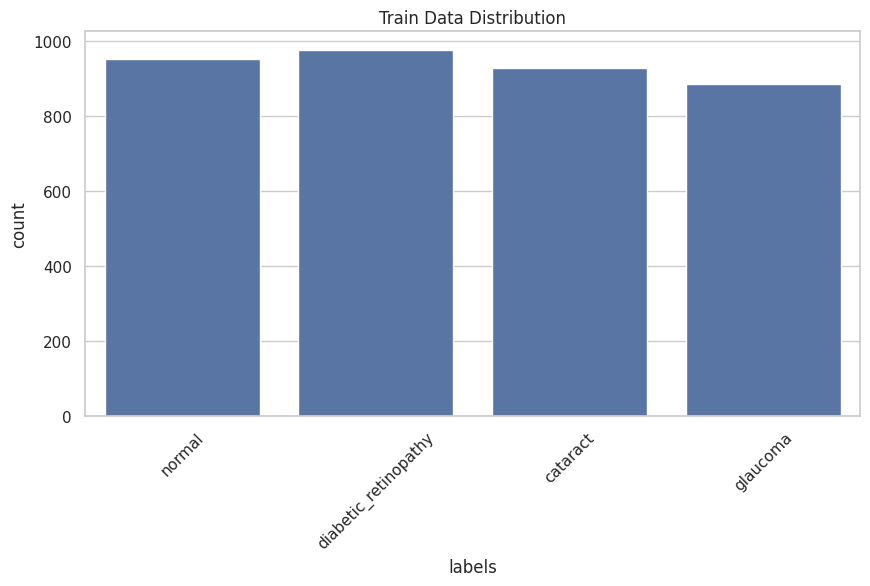

In [ ]:
plt.figure(figsize=(10, 5))
sns.set(style="whitegrid")
ax = sns.countplot(data=train_valid_df, x='labels')

plt.title('Train Data Distribution')
plt.xticks(rotation=45)
plt.show()

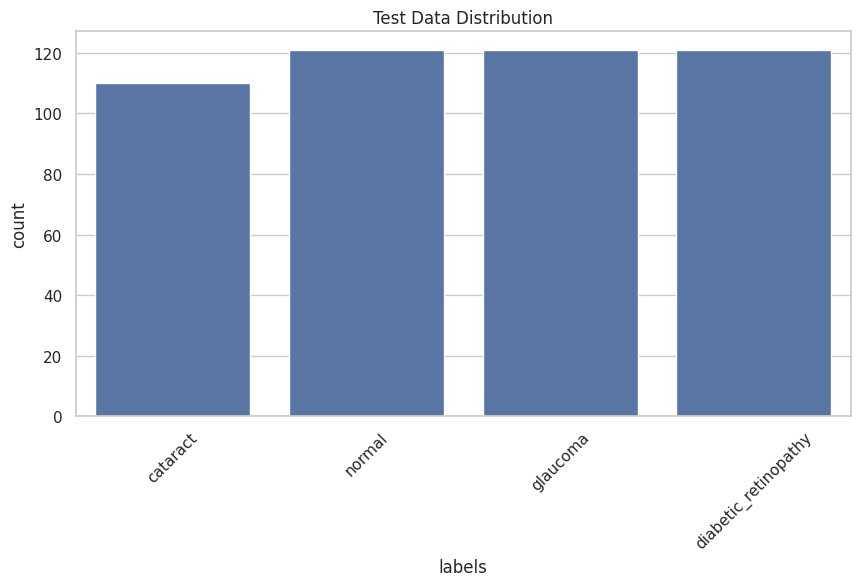

In [ ]:
plt.figure(figsize=(10, 5))
sns.set(style="whitegrid")
ax = sns.countplot(data=test_df, x='labels')

plt.title('Test Data Distribution')
plt.xticks(rotation=45)
plt.show()

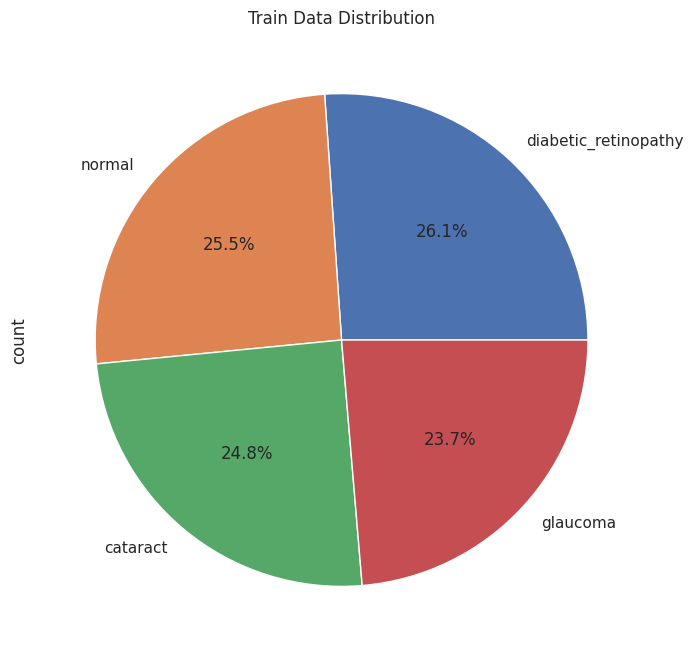

In [ ]:
plt.figure(figsize=(10, 8))
train_valid_df['labels'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Train Data Distribution')
plt.show()

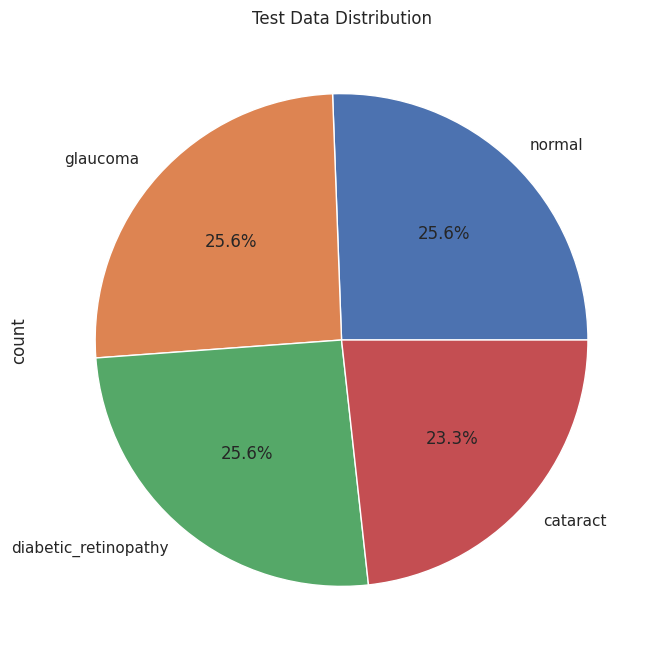

In [ ]:
plt.figure(figsize=(10, 8))
test_df['labels'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Test Data Distribution')
plt.show()

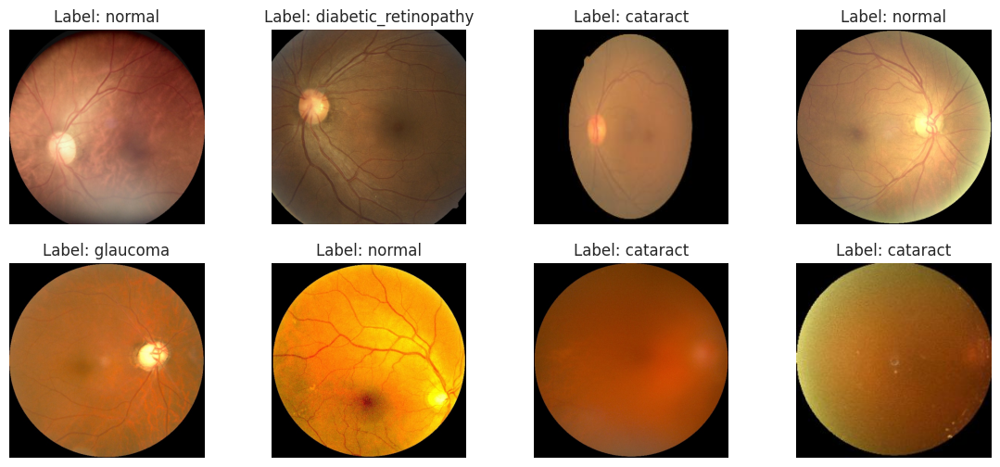

In [ ]:
def display_images(df, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(14, 6))
    for r in range(rows):
        for c in range(cols):
            index = r * cols + c
            if index < len(df):
                image_path = df.iloc[index]['filepaths']
                label = df.iloc[index]['labels']
                img = Image.open(image_path)
                axes[r, c].imshow(img)
                axes[r, c].set_title(f'Label: {label}')
                axes[r, c].axis('off')
            else:
                axes[r, c].axis('off')

    plt.show()

rows = 2
cols = 4

display_images(train_valid_df, rows, cols)

# Data Preprocessing

# **Data Augmentation**

# **Train Set**

In [9]:
train_df, valid_df = train_test_split(train_valid_df,  train_size= 0.8, shuffle= True, random_state= 123, stratify= train_valid_df['labels'])

In [10]:
def scalar(img):
        return img

train_generator = ImageDataGenerator(preprocessing_function = scalar,
                                     horizontal_flip = True)

test_generator = ImageDataGenerator(preprocessing_function = scalar)

In [11]:
train_set = train_generator.flow_from_dataframe( train_df,
                                        x_col= 'filepaths',
                                        y_col= 'labels',
                                        target_size= (224, 224),
                                        class_mode= 'categorical',
                                        color_mode= 'rgb',
                                        shuffle= True,
                                        batch_size= 40
)

Found 2995 validated image filenames belonging to 4 classes.


In [12]:
valid_set = test_generator.flow_from_dataframe( valid_df,
                                       x_col= 'filepaths',
                                       y_col= 'labels',
                                       target_size= (224, 224),
                                       class_mode= 'categorical',
                                       color_mode= 'rgb',
                                       shuffle= True,
                                       batch_size= 40
)

Found 749 validated image filenames belonging to 4 classes.


In [13]:
test_set = test_generator.flow_from_dataframe( test_df,
                                      x_col= 'filepaths',
                                      y_col= 'labels',
                                      target_size= (224, 224),
                                      class_mode= 'categorical',
                                      color_mode= 'rgb',
                                      shuffle= False,
                                      batch_size= 40
)

Found 473 validated image filenames belonging to 4 classes.


# **TL Models**

# **InceptionResNetV2**

In [ ]:
base_model = InceptionResNetV2(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

output = Dense(4, activation='softmax')(x)

inceptionResNetV2_model = Model(inputs = base_model.input, outputs = output)

inceptionResNetV2_model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

inceptionResNetV2_model.summary()

checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)


219055592/219055592 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_4[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)   

In [ ]:
start_time = time.time()

history = inceptionResNetV2_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
75/75 [==============================] - ETA: 0s - loss: 7.2130 - accuracy: 0.7923
Epoch 1: val_accuracy improved from -inf to 0.78104, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


75/75 [==============================] - 169s 1s/step - loss: 7.2130 - accuracy: 0.7923 - val_loss: 31.5573 - val_accuracy: 0.7810
Epoch 2/40
75/75 [==============================] - ETA: 0s - loss: 5.6428 - accuracy: 0.9035
Epoch 2: val_accuracy improved from 0.78104 to 0.88518, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5
75/75 [==============================] - 73s 968ms/step - loss: 5.6428 - accuracy: 0.9035 - val_loss: 5.9576 - val_accuracy: 0.8852
Epoch 3/40
75/75 [==============================] - ETA: 0s - loss: 4.7006 - accuracy: 0.9239
Epoch 3: val_accuracy improved from 0.88518 to 0.90921, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5
75/75 [==============================] - 76s 1s/step - loss: 4.7006 - accuracy: 0.9239 - val_loss: 4.8716 - val_accuracy: 0.9092
Epoch 4/40
75/75 [==============================] - ETA: 0s - loss: 3.9471 - accuracy: 0.9419
Epoch 4: val_accuracy did not improve from 0.90921
75/75 [====

# **Training , Validation accuracy and loss Visualiztion**

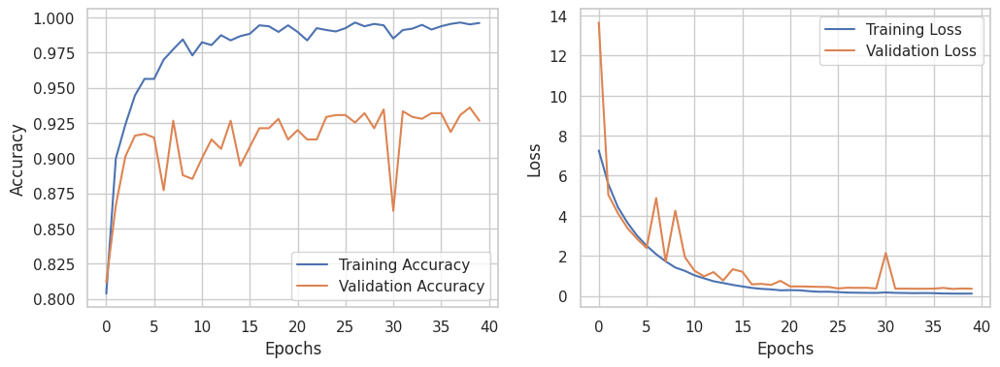

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# **classification report**

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = inceptionResNetV2_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

12/12 [==============================] - 6s 213ms/step
Classification Report:
                       precision    recall  f1-score   support

            cataract       0.93      0.89      0.91       110
diabetic_retinopathy       1.00      1.00      1.00       121
            glaucoma       0.84      0.98      0.90       121
              normal       1.00      0.87      0.93       121

            accuracy                           0.94       473
           macro avg       0.94      0.94      0.94       473
        weighted avg       0.94      0.94      0.94       473



# **Model Evalution**

In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5")
train_loss, train_accuracy = model.evaluate(train_set)
validation_loss, validation_accuracy = model.evaluate(valid_set)
test_loss, test_accuracy = model.evaluate(test_set)

print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Train Loss:':<20} {train_loss}")
print(f"{'Train Accuracy:':<20} {train_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Validation Loss:':<20} {validation_loss}")
print(f"{'Validation Accuracy:':<20} {validation_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Test Loss:':<20} {test_loss}")
print(f"{'Test Accuracy:':<20} {test_accuracy}")


12/12 [==============================] - 3s 221ms/step - loss: 0.2557 - accuracy: 0.9493

----------------------------------------
----------------------------------------
Train Loss:          0.09382758289575577
Train Accuracy:      0.9979966878890991

----------------------------------------
----------------------------------------
Validation Loss:     0.36838942766189575
Validation Accuracy: 0.9359145760536194

----------------------------------------
----------------------------------------
Test Loss:           0.2556900680065155
Test Accuracy:       0.9492600560188293


# **Prediction**

1/1 [==============================] - 0s 36ms/step


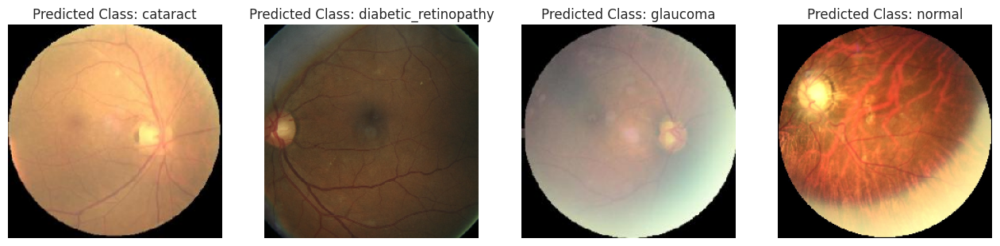

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5'

image_paths = [
    '/content/eye-diseases-classification/test/cataract/_10_3215668.jpg',
    '/content/eye-diseases-classification/test/diabetic_retinopathy/1002_right.jpeg',
    '/content/eye-diseases-classification/test/glaucoma/_11_6435526.jpg',
    '/content/eye-diseases-classification/test/normal/1253_left.jpg'
]

predict_and_display_images(image_paths, model_path)


# **Feature Map**

1/1 [==============================] - 0s 49ms/step


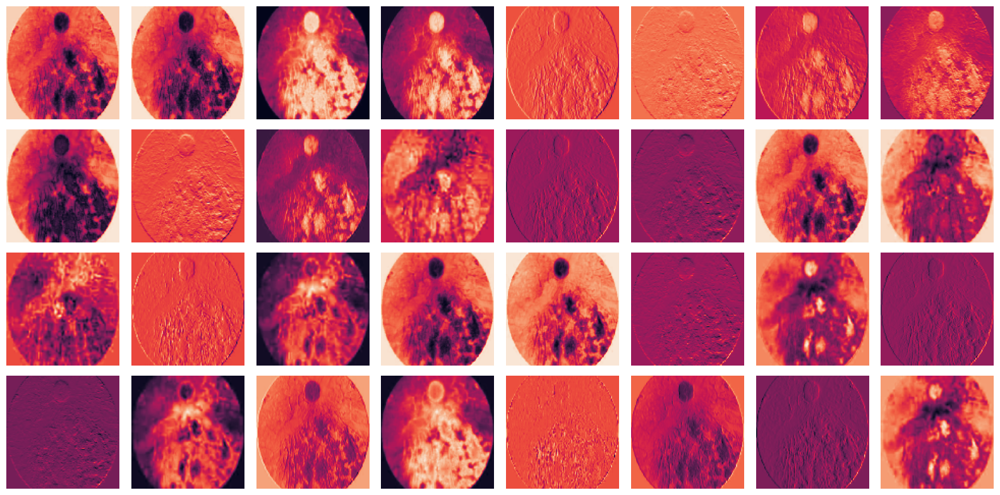

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img_array = preprocess_input(np.expand_dims(img_to_array(load_img(img_path, target_size=(224, 224))), axis=0))
    activations = Model(inputs=model.input, outputs=model.get_layer(layer_name).output).predict(img_array)
    num_filters, rows = activations.shape[-1], int(np.ceil(activations.shape[-1] / 8))
    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))
    for i in range(rows):
        for j in range(8):
            idx = i * 8 + j
            if idx < num_filters:
                axs[i, j].imshow(activations[0, :, :, idx])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()
layer_name = 'conv2d'
img_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'

visualize_activation_maps(model, img_path, layer_name)


# **Image Segmentation**

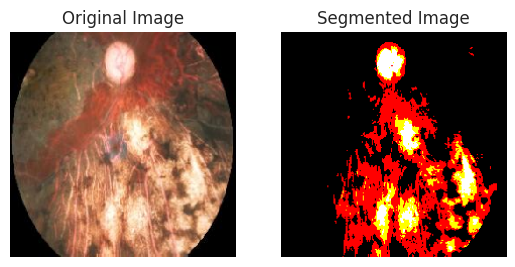

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
img = image.load_img(img_path, target_size=(224, 224))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.

threshold = 0.75
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')

plt.show()


# **Computational Tomography**

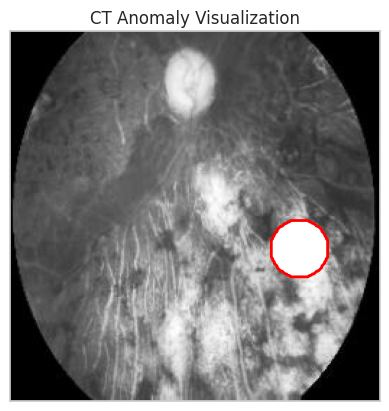

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_location, anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)

    # Create a meshgrid to define the anomaly mask
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0

    return grayscale_image, anomaly_mask

def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')

    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)

    plt.title('CT Anomaly Visualization')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
    anomaly_location = (150, 200)  # Example anomaly location (row, column)
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path, anomaly_location)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


# **Heatmap**

## **Xception**

In [ ]:
base_model = Xception(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

output = Dense(4, activation='softmax')(x)

Xception_model = Model(inputs = base_model.input, outputs = output)
Xception_model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

Xception_model.summary()

checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

83683744/83683744 [==============================] - 2s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 111, 111, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  

In [ ]:
start_time = time.time()

history = Xception_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
75/75 [==============================] - ETA: 0s - loss: 7.7346 - accuracy: 0.7750
Epoch 1: val_accuracy improved from -inf to 0.75033, saving model to /content/drive/MyDrive/Colab_Notebooks/Xception_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


75/75 [==============================] - 124s 1s/step - loss: 7.7346 - accuracy: 0.7750 - val_loss: 6.8912 - val_accuracy: 0.7503
Epoch 2/40
75/75 [==============================] - ETA: 0s - loss: 5.4446 - accuracy: 0.9078
Epoch 2: val_accuracy improved from 0.75033 to 0.88251, saving model to /content/drive/MyDrive/Colab_Notebooks/Xception_model.h5
75/75 [==============================] - 57s 762ms/step - loss: 5.4446 - accuracy: 0.9078 - val_loss: 4.9283 - val_accuracy: 0.8825
Epoch 3/40
75/75 [==============================] - ETA: 0s - loss: 4.2127 - accuracy: 0.9326
Epoch 3: val_accuracy improved from 0.88251 to 0.90387, saving model to /content/drive/MyDrive/Colab_Notebooks/Xception_model.h5
75/75 [==============================] - 54s 711ms/step - loss: 4.2127 - accuracy: 0.9326 - val_loss: 3.7711 - val_accuracy: 0.9039
Epoch 4/40
75/75 [==============================] - ETA: 0s - loss: 3.2607 - accuracy: 0.9619
Epoch 4: val_accuracy did not improve from 0.90387
75/75 [========

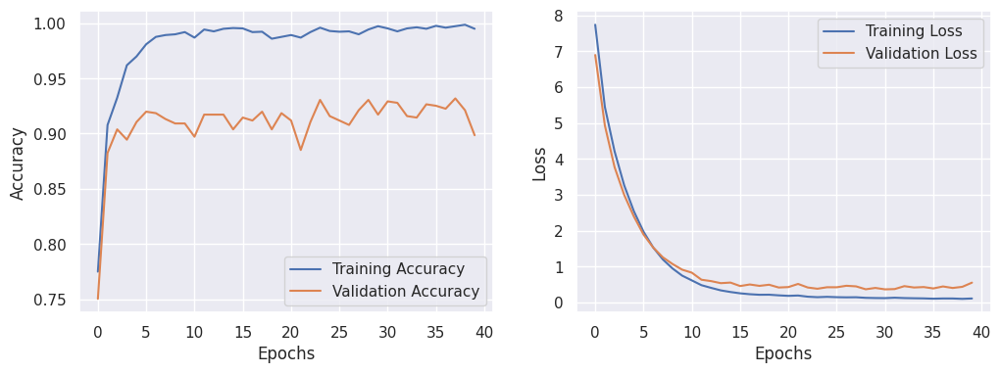

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = Xception_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

12/12 [==============================] - 6s 467ms/step
Classification Report:
                       precision    recall  f1-score   support

            cataract       0.97      0.77      0.86       110
diabetic_retinopathy       1.00      1.00      1.00       121
            glaucoma       0.66      0.99      0.79       121
              normal       1.00      0.68      0.81       121

            accuracy                           0.86       473
           macro avg       0.91      0.86      0.86       473
        weighted avg       0.90      0.86      0.86       473



In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5")
train_loss, train_accuracy = model.evaluate(train_set)
validation_loss, validation_accuracy = model.evaluate(valid_set)
test_loss, test_accuracy = model.evaluate(test_set)

print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Train Loss:':<20} {train_loss}")
print(f"{'Train Accuracy:':<20} {train_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Validation Loss:':<20} {validation_loss}")
print(f"{'Validation Accuracy:':<20} {validation_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Test Loss:':<20} {test_loss}")
print(f"{'Test Accuracy:':<20} {test_accuracy}")

12/12 [==============================] - 2s 156ms/step - loss: 0.2335 - accuracy: 0.9619

----------------------------------------
----------------------------------------
Train Loss:          0.09181573241949081
Train Accuracy:      0.9979966878890991

----------------------------------------
----------------------------------------
Validation Loss:     0.4012311100959778
Validation Accuracy: 0.9319092035293579

----------------------------------------
----------------------------------------
Test Loss:           0.23346219956874847
Test Accuracy:       0.9619450569152832


1/1 [==============================] - 0s 33ms/step


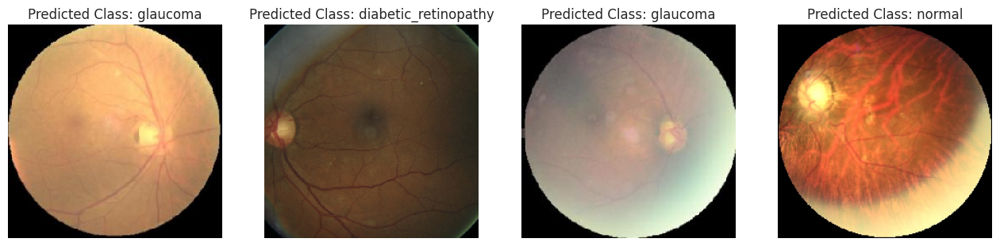

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5'

image_paths = [
    '/content/eye-diseases-classification/test/cataract/_10_3215668.jpg',
    '/content/eye-diseases-classification/test/diabetic_retinopathy/1002_right.jpeg',
    '/content/eye-diseases-classification/test/glaucoma/_11_6435526.jpg',
    '/content/eye-diseases-classification/test/normal/1253_left.jpg'
]

predict_and_display_images(image_paths, model_path)


1/1 [==============================] - 0s 59ms/step


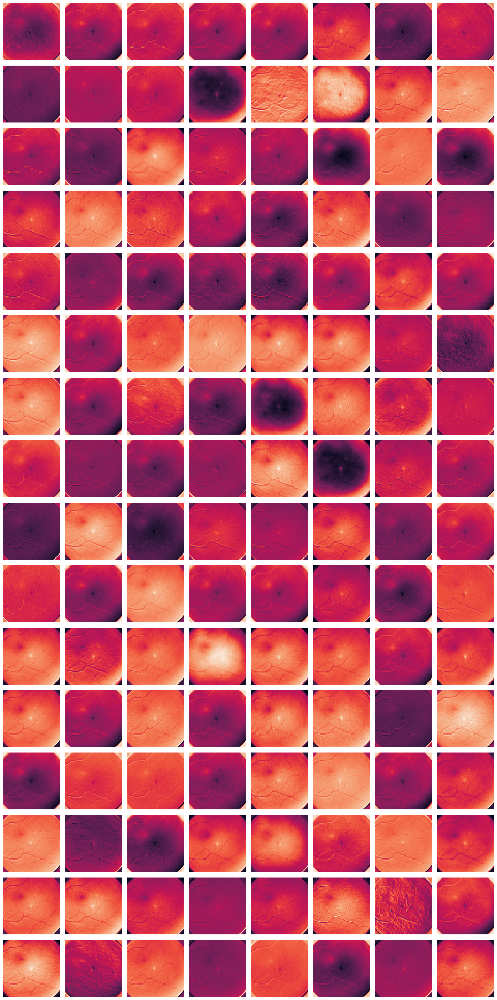

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img_array = preprocess_input(np.expand_dims(img_to_array(load_img(img_path, target_size=(224, 224))), axis=0))
    activations = Model(inputs=model.input, outputs=model.get_layer(layer_name).output).predict(img_array)
    num_filters, rows = activations.shape[-1], int(np.ceil(activations.shape[-1] / 8))
    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))
    for i in range(rows):
        for j in range(8):
            idx = i * 8 + j
            if idx < num_filters:
                axs[i, j].imshow(activations[0, :, :, idx])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()
layer_name = 'conv2d'
img_path = '/content/eye-diseases-classification/test/diabetic_retinopathy/1102_right.jpeg'

visualize_activation_maps(Xception_model, img_path, layer_name)

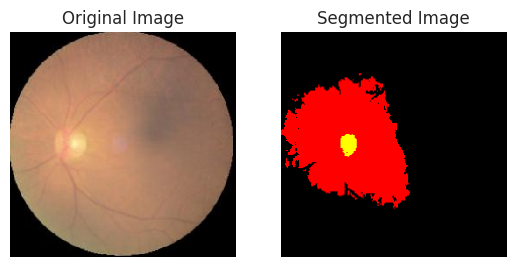

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/eye-diseases-classification/test/cataract/_4_1244424.jpg'
img = image.load_img(img_path, target_size=(224, 224))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')  # Turn off axis ticks and labels

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.

# Segmented Image
threshold = 0.75
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')  # Turn off axis ticks and labels

plt.show()

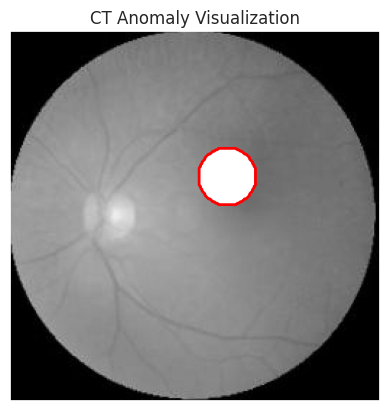

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_location=(100, 150), anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)
    anomaly_mask = np.zeros_like(grayscale_image, dtype=bool)
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0
    return grayscale_image, anomaly_mask
def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):
    # Create a figure without axes
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')
    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)
    plt.title('CT Anomaly Visualization')
    plt.show()
if __name__ == "__main__":
    image_path = '/content/eye-diseases-classification/test/cataract/_4_1244424.jpg'
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


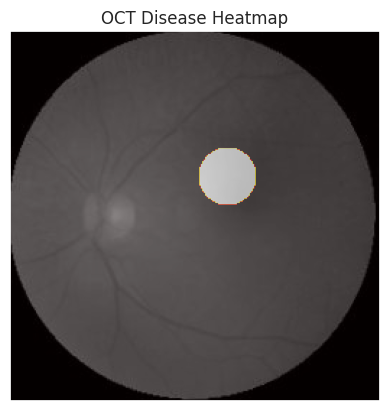

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_oct_heatmap(image_path, disease_location=(100, 150), disease_size=20):
    oct_image = io.imread(image_path)
    oct_image_gray = color.rgb2gray(oct_image)
    rr, cc = np.meshgrid(np.arange(oct_image_gray.shape[0]), np.arange(oct_image_gray.shape[1]), indexing='ij')
    disease_mask = ((rr - disease_location[0])**2 + (cc - disease_location[1])**2) < disease_size**2
    oct_heatmap = np.zeros_like(oct_image_gray)
    oct_heatmap[disease_mask] = 1.0

    return oct_image_gray, oct_heatmap

def visualize_oct_heatmap(oct_image_gray, oct_heatmap):
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(oct_image_gray, cmap='gray')
    plt.imshow(oct_heatmap, cmap='hot', alpha=0.5)
    plt.title('OCT Disease Heatmap')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/eye-diseases-classification/test/cataract/_4_1244424.jpg'
    oct_image_gray, oct_heatmap = generate_oct_heatmap(image_path)
    visualize_oct_heatmap(oct_image_gray, oct_heatmap)

# **DenseNet169**

In [ ]:
base_model = DenseNet169(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

output = Dense(4, activation='softmax')(x)

DenseNet169_model = Model(inputs = base_model.input, outputs = output)

DenseNet169_model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

DenseNet169_model.summary()

checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)


51877672/51877672 [==============================] - 3s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  

In [ ]:
start_time = time.time()

history = DenseNet169_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
75/75 [==============================] - ETA: 0s - loss: 5.1223 - accuracy: 0.8250
Epoch 1: val_accuracy improved from -inf to 0.59146, saving model to /content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


75/75 [==============================] - 192s 1s/step - loss: 5.1223 - accuracy: 0.8250 - val_loss: 6.3604 - val_accuracy: 0.5915
Epoch 2/40
75/75 [==============================] - ETA: 0s - loss: 2.8186 - accuracy: 0.9199
Epoch 2: val_accuracy improved from 0.59146 to 0.85848, saving model to /content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5
75/75 [==============================] - 52s 693ms/step - loss: 2.8186 - accuracy: 0.9199 - val_loss: 2.7916 - val_accuracy: 0.8585
Epoch 3/40
75/75 [==============================] - ETA: 0s - loss: 2.0206 - accuracy: 0.9399
Epoch 3: val_accuracy improved from 0.85848 to 0.89720, saving model to /content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5
75/75 [==============================] - 54s 719ms/step - loss: 2.0206 - accuracy: 0.9399 - val_loss: 1.8956 - val_accuracy: 0.8972
Epoch 4/40
75/75 [==============================] - ETA: 0s - loss: 1.5321 - accuracy: 0.9472
Epoch 4: val_accuracy improved from 0.89720 to 0.92523, saving model to 

# **InceptionV3**

In [ ]:

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import ModelCheckpoint

base_model = InceptionV3(include_top=False, weights="imagenet", input_shape=(224, 224, 3), pooling='max')
x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006))(x)
x = Dropout(0.3)(x)

output = Dense(4, activation='softmax')(x)
InceptionV3_model = Model(inputs=base_model.input, outputs=output)
InceptionV3_model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
InceptionV3_model.summary()
checkpoint_callback_val_acc = ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)


Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_282 (Conv2D)         (None, 111, 111, 32)         864       ['input_4[0][0]']             
                                                                                                  
 batch_normalization_285 (B  (None, 111, 111, 32)         96        ['conv2d_282[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_282 (Activation  (None, 111, 111, 32)         0         ['batch_normalization_28

In [ ]:
start_time = time.time()

history = InceptionV3_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
75/75 [==============================] - ETA: 0s - loss: 6.8796 - accuracy: 0.7479
Epoch 1: val_accuracy improved from -inf to 0.23632, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5
75/75 [==============================] - 79s 669ms/step - loss: 6.8796 - accuracy: 0.7479 - val_loss: 1165.8655 - val_accuracy: 0.2363
Epoch 2/40
75/75 [==============================] - ETA: 0s - loss: 3.7834 - accuracy: 0.7953
Epoch 2: val_accuracy improved from 0.23632 to 0.25501, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5
75/75 [==============================] - 45s 597ms/step - loss: 3.7834 - accuracy: 0.7953 - val_loss: 6.9151 - val_accuracy: 0.2550
Epoch 3/40
75/75 [==============================] - ETA: 0s - loss: 2.2715 - accuracy: 0.7683
Epoch 3: val_accuracy improved from 0.25501 to 0.31776, saving model to /content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5
75/75 [==============================] - 42s 551ms/step - loss: 2.2715 - acc

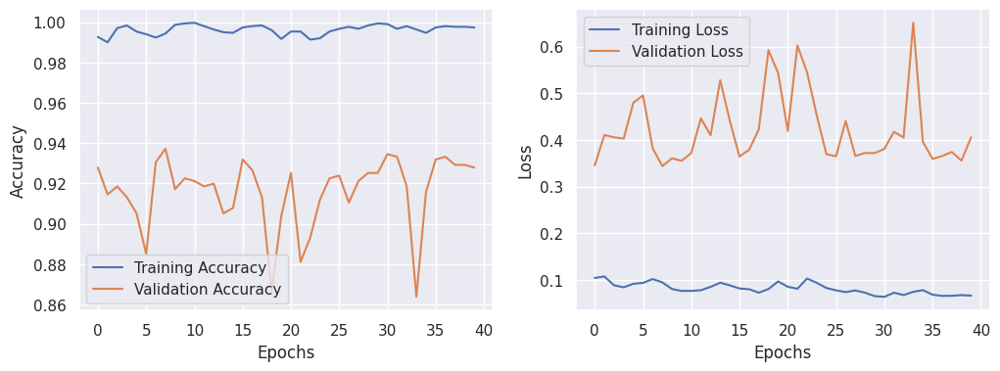

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = DenseNet169_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

12/12 [==============================] - 10s 640ms/step
Classification Report:
                       precision    recall  f1-score   support

            cataract       0.90      0.93      0.91       110
diabetic_retinopathy       1.00      1.00      1.00       121
            glaucoma       0.90      0.93      0.91       121
              normal       0.97      0.92      0.94       121

            accuracy                           0.94       473
           macro avg       0.94      0.94      0.94       473
        weighted avg       0.94      0.94      0.94       473



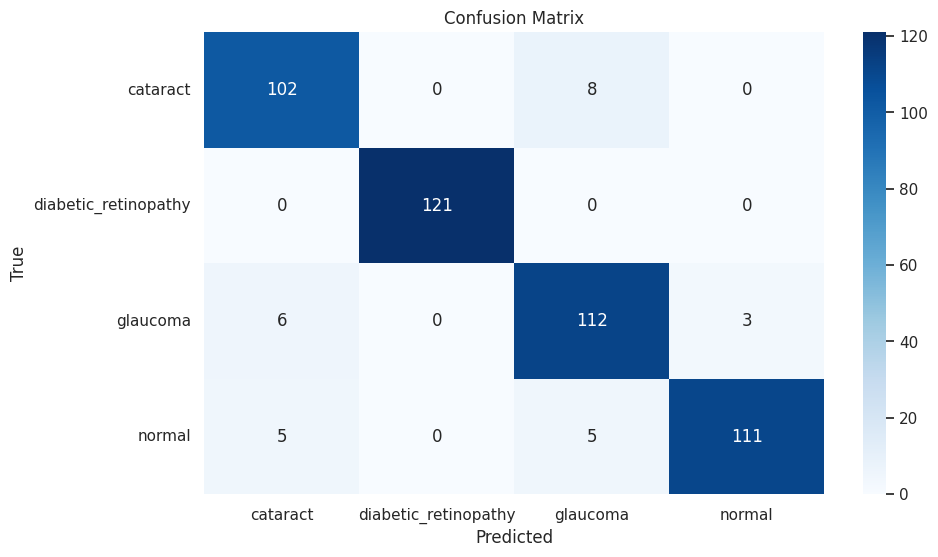

In [ ]:

confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5")
train_loss, train_accuracy = model.evaluate(train_set)
validation_loss, validation_accuracy = model.evaluate(valid_set)
test_loss, test_accuracy = model.evaluate(test_set)

print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Train Loss:':<20} {train_loss}")
print(f"{'Train Accuracy:':<20} {train_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Validation Loss:':<20} {validation_loss}")
print(f"{'Validation Accuracy:':<20} {validation_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Test Loss:':<20} {test_loss}")
print(f"{'Test Accuracy:':<20} {test_accuracy}")


12/12 [==============================] - 2s 140ms/step - loss: 0.2482 - accuracy: 0.9429

----------------------------------------
----------------------------------------
Train Loss:          0.07760458439588547
Train Accuracy:      0.9963272213935852

----------------------------------------
----------------------------------------
Validation Loss:     0.34379515051841736
Validation Accuracy: 0.9372496604919434

----------------------------------------
----------------------------------------
Test Loss:           0.24817122519016266
Test Accuracy:       0.94291752576828


1/1 [==============================] - 0s 31ms/step


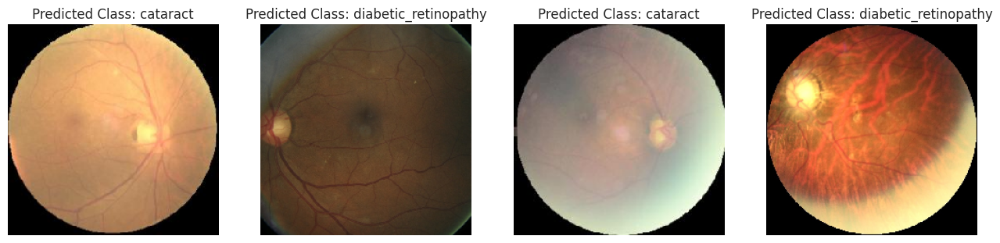

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5'

image_paths = [
    '/content/eye-diseases-classification/test/cataract/_10_3215668.jpg',
    '/content/eye-diseases-classification/test/diabetic_retinopathy/1002_right.jpeg',
    '/content/eye-diseases-classification/test/glaucoma/_11_6435526.jpg',
    '/content/eye-diseases-classification/test/normal/1253_left.jpg'
]

predict_and_display_images(image_paths, model_path)


1/1 [==============================] - 2s 2s/step


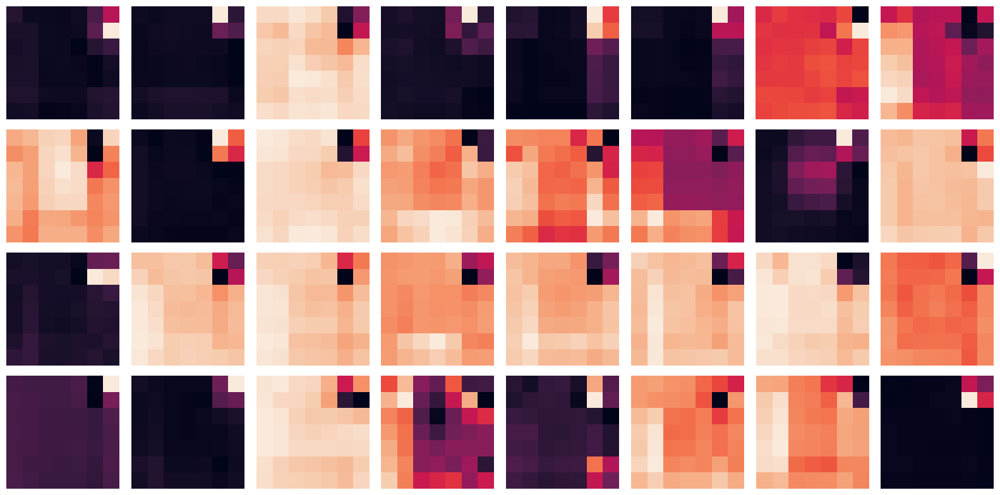

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img_array = preprocess_input(np.expand_dims(img_to_array(load_img(img_path, target_size=(224, 224))), axis=0))
    activations = Model(inputs=model.input, outputs=model.get_layer(layer_name).output).predict(img_array)
    num_filters, rows = activations.shape[-1], int(np.ceil(activations.shape[-1] / 8))
    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))
    for i in range(rows):
        for j in range(8):
            idx = i * 8 + j
            if idx < num_filters:
                axs[i, j].imshow(activations[0, :, :, idx])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()
layer_name = 'conv5_block24_2_conv'
img_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'

visualize_activation_maps(model, img_path, layer_name)


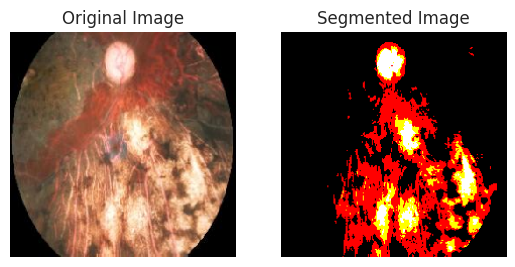

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
img = image.load_img(img_path, target_size=(224, 224))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')  # Turn off axis ticks and labels

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.

# Segmented Image
threshold = 0.75
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')  # Turn off axis ticks and labels

plt.show()


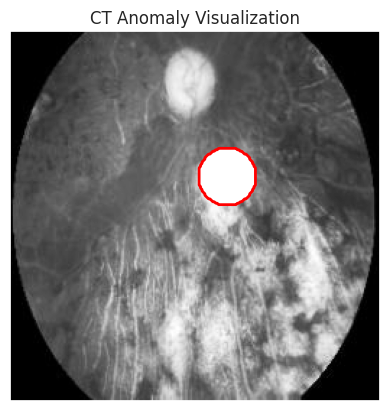

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_location=(100, 150), anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)
    anomaly_mask = np.zeros_like(grayscale_image, dtype=bool)
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0
    return grayscale_image, anomaly_mask
def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):
    # Create a figure without axes
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')
    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)
    plt.title('CT Anomaly Visualization')
    plt.show()
if __name__ == "__main__":
    image_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


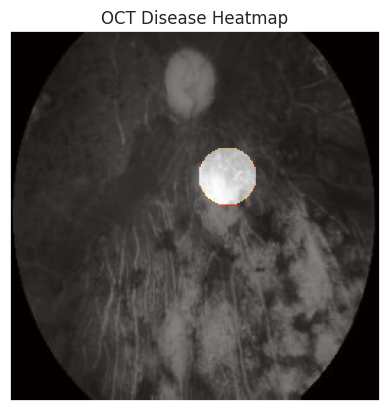

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_oct_heatmap(image_path, disease_location=(100, 150), disease_size=20):
    oct_image = io.imread(image_path)
    oct_image_gray = color.rgb2gray(oct_image)
    rr, cc = np.meshgrid(np.arange(oct_image_gray.shape[0]), np.arange(oct_image_gray.shape[1]), indexing='ij')
    disease_mask = ((rr - disease_location[0])**2 + (cc - disease_location[1])**2) < disease_size**2
    oct_heatmap = np.zeros_like(oct_image_gray)
    oct_heatmap[disease_mask] = 1.0

    return oct_image_gray, oct_heatmap

def visualize_oct_heatmap(oct_image_gray, oct_heatmap):
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(oct_image_gray, cmap='gray')
    plt.imshow(oct_heatmap, cmap='hot', alpha=0.5)
    plt.title('OCT Disease Heatmap')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
    oct_image_gray, oct_heatmap = generate_oct_heatmap(image_path)
    visualize_oct_heatmap(oct_image_gray, oct_heatmap)


# **MobileNetV2**

In [ ]:
base_model = MobileNetV2(include_top= False, weights= "imagenet", input_shape= (224,224,3), pooling= 'max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

output = Dense(4, activation='softmax')(x)

MobileNetV2_model = Model(inputs = base_model.input, outputs = output)

MobileNetV2_model.compile(Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

MobileNetV2_model.summary()

checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/MobileNetV2.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)


9406464/9406464 [==============================] - 2s 0us/step
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_5[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           

In [ ]:
start_time = time.time()

history = MobileNetV2_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
75/75 [==============================] - ETA: 0s - loss: 7.2215 - accuracy: 0.7893
Epoch 1: val_accuracy improved from -inf to 0.47397, saving model to /content/drive/MyDrive/Colab_Notebooks/MobileNetV2.h5
75/75 [==============================] - 65s 556ms/step - loss: 7.2215 - accuracy: 0.7893 - val_loss: 7.1438 - val_accuracy: 0.4740
Epoch 2/40
75/75 [==============================] - ETA: 0s - loss: 5.0985 - accuracy: 0.9042
Epoch 2: val_accuracy did not improve from 0.47397
75/75 [==============================] - 33s 437ms/step - loss: 5.0985 - accuracy: 0.9042 - val_loss: 5.8192 - val_accuracy: 0.4486
Epoch 3/40
75/75 [==============================] - ETA: 0s - loss: 3.7970 - accuracy: 0.9282
Epoch 3: val_accuracy improved from 0.47397 to 0.59279, saving model to /content/drive/MyDrive/Colab_Notebooks/MobileNetV2.h5
75/75 [==============================] - 32s 430ms/step - loss: 3.7970 - accuracy: 0.9282 - val_loss: 4.4571 - val_accuracy: 0.5928
Epoch 4/40
75/75 [====

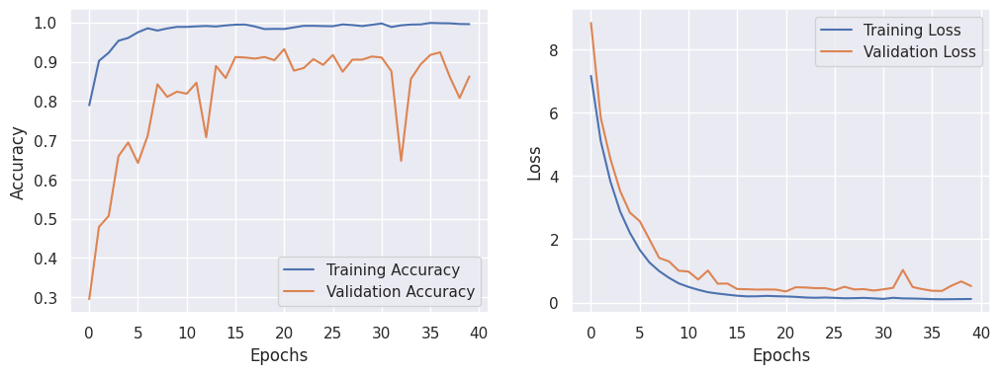

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = MobileNetV2_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

12/12 [==============================] - 3s 180ms/step
Classification Report:
                       precision    recall  f1-score   support

            cataract       0.94      0.87      0.91       110
diabetic_retinopathy       0.78      1.00      0.88       121
            glaucoma       0.79      0.98      0.88       121
              normal       0.98      0.53      0.69       121

            accuracy                           0.85       473
           macro avg       0.87      0.85      0.84       473
        weighted avg       0.87      0.85      0.83       473



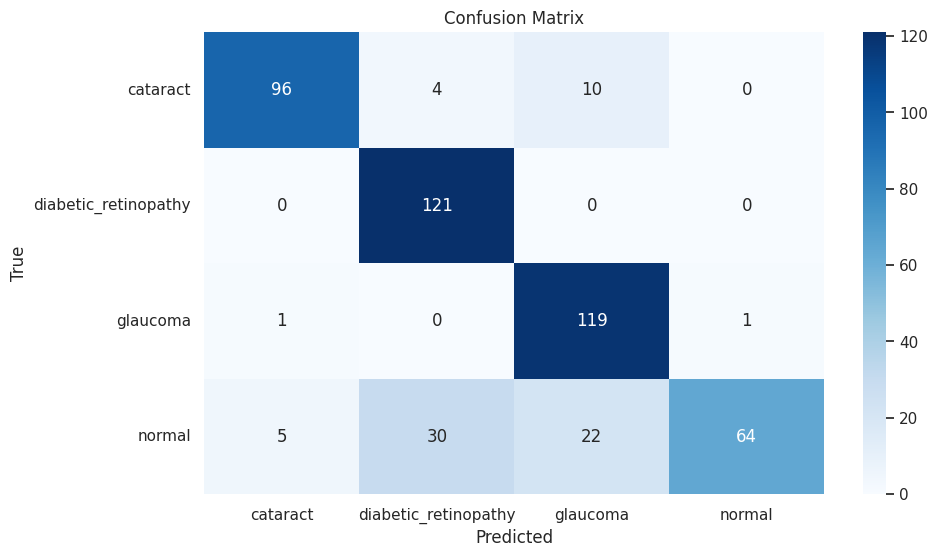

In [ ]:

confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Colab_Notebooks/MobileNetV2.h5")
train_loss, train_accuracy = model.evaluate(train_set)
validation_loss, validation_accuracy = model.evaluate(valid_set)
test_loss, test_accuracy = model.evaluate(test_set)

print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Train Loss:':<20} {train_loss}")
print(f"{'Train Accuracy:':<20} {train_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Validation Loss:':<20} {validation_loss}")
print(f"{'Validation Accuracy:':<20} {validation_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Test Loss:':<20} {test_loss}")
print(f"{'Test Accuracy:':<20} {test_accuracy}")


12/12 [==============================] - 1s 96ms/step - loss: 0.3050 - accuracy: 0.9387

----------------------------------------
----------------------------------------
Train Loss:          0.1830812245607376
Train Accuracy:      0.9873121976852417

----------------------------------------
----------------------------------------
Validation Loss:     0.34832021594047546
Validation Accuracy: 0.9319092035293579

----------------------------------------
----------------------------------------
Test Loss:           0.30503228306770325
Test Accuracy:       0.9386892318725586


1/1 [==============================] - 0s 22ms/step


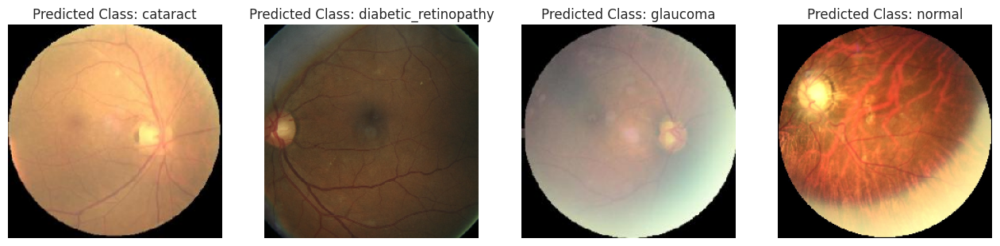

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/MobileNetV2.h5'

image_paths = [
    '/content/eye-diseases-classification/test/cataract/_10_3215668.jpg',
    '/content/eye-diseases-classification/test/diabetic_retinopathy/1002_right.jpeg',
    '/content/eye-diseases-classification/test/glaucoma/_11_6435526.jpg',
    '/content/eye-diseases-classification/test/normal/1253_left.jpg'
]

predict_and_display_images(image_paths, model_path)


1/1 [==============================] - 0s 63ms/step


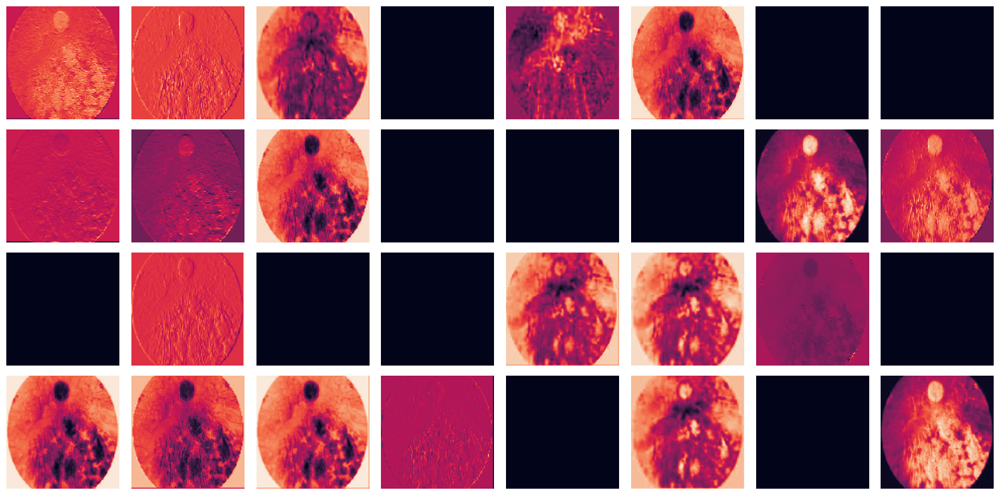

In [ ]:
def visualize_activation_maps(model, img_path, layer_name):
    img_array = preprocess_input(np.expand_dims(img_to_array(load_img(img_path, target_size=(224, 224))), axis=0))
    activations = Model(inputs=MobileNetV2_model.input, outputs=MobileNetV2_model.get_layer(layer_name).output).predict(img_array)
    num_filters, rows = activations.shape[-1], int(np.ceil(activations.shape[-1] / 8))
    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))
    for i in range(rows):
        for j in range(8):
            idx = i * 8 + j
            if idx < num_filters:
                axs[i, j].imshow(activations[0, :, :, idx])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()
layer_name = 'Conv1_relu'
img_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'

visualize_activation_maps(model, img_path, layer_name)


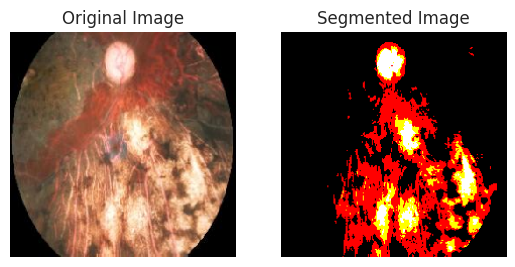

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
img = image.load_img(img_path, target_size=(224, 224))

# Original Image
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')  # Turn off axis ticks and labels

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.

# Segmented Image
threshold = 0.75
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')  # Turn off axis ticks and labels

plt.show()


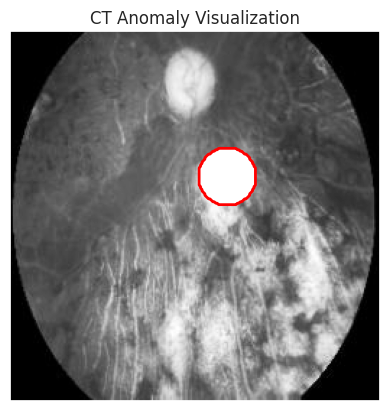

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_location=(100, 150), anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)
    anomaly_mask = np.zeros_like(grayscale_image, dtype=bool)
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0
    return grayscale_image, anomaly_mask
def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):
    # Create a figure without axes
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')
    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)
    plt.title('CT Anomaly Visualization')
    plt.show()
if __name__ == "__main__":
    image_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


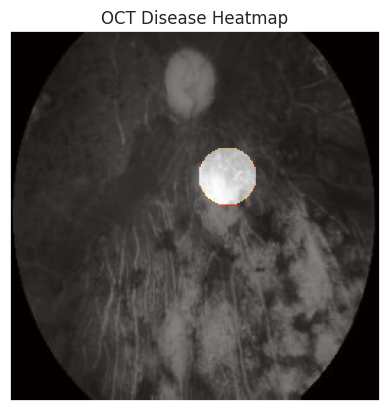

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_oct_heatmap(image_path, disease_location=(100, 150), disease_size=20):
    oct_image = io.imread(image_path)
    oct_image_gray = color.rgb2gray(oct_image)
    rr, cc = np.meshgrid(np.arange(oct_image_gray.shape[0]), np.arange(oct_image_gray.shape[1]), indexing='ij')
    disease_mask = ((rr - disease_location[0])**2 + (cc - disease_location[1])**2) < disease_size**2
    oct_heatmap = np.zeros_like(oct_image_gray)
    oct_heatmap[disease_mask] = 1.0

    return oct_image_gray, oct_heatmap

def visualize_oct_heatmap(oct_image_gray, oct_heatmap):
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(oct_image_gray, cmap='gray')
    plt.imshow(oct_heatmap, cmap='hot', alpha=0.5)
    plt.title('OCT Disease Heatmap')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
    oct_image_gray, oct_heatmap = generate_oct_heatmap(image_path)
    visualize_oct_heatmap(oct_image_gray, oct_heatmap)


In [ ]:
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, GlobalMaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l1, l2
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler

base_model = ResNet50V2(include_top=False, weights="imagenet", input_shape=(224, 224, 3), pooling='max')
x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006))(x)
x = Dropout(0.3)(x)

output = Dense(4, activation='softmax')(x)
ResNet50V2_model = Model(inputs=base_model.input, outputs=output)
ResNet50V2_model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
ResNet50V2_model.summary()
checkpoint_callback_val_acc = ModelCheckpoint(
    filepath='/content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)


94668760/94668760 [==============================] - 5s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                             

In [ ]:
start_time = time.time()

history = ResNet50V2_model.fit(x= train_set,
                    epochs= 40,
                    verbose= 1,
                    validation_data= valid_set,
                    callbacks=[checkpoint_callback_val_acc]
)
print(f"Training time: {time.time() - start_time} seconds")

Epoch 1/40
75/75 [==============================] - ETA: 0s - loss: 6.2341 - accuracy: 0.7462
Epoch 1: val_accuracy improved from -inf to 0.29239, saving model to /content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


75/75 [==============================] - 101s 822ms/step - loss: 6.2341 - accuracy: 0.7462 - val_loss: 26.9291 - val_accuracy: 0.2924
Epoch 2/40
75/75 [==============================] - ETA: 0s - loss: 2.4433 - accuracy: 0.8541
Epoch 2: val_accuracy did not improve from 0.29239
75/75 [==============================] - 39s 524ms/step - loss: 2.4433 - accuracy: 0.8541 - val_loss: 34.7305 - val_accuracy: 0.2857
Epoch 3/40
75/75 [==============================] - ETA: 0s - loss: 1.1130 - accuracy: 0.8928
Epoch 3: val_accuracy improved from 0.29239 to 0.51268, saving model to /content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5
75/75 [==============================] - 45s 594ms/step - loss: 1.1130 - accuracy: 0.8928 - val_loss: 3.3553 - val_accuracy: 0.5127
Epoch 4/40
75/75 [==============================] - ETA: 0s - loss: 0.7156 - accuracy: 0.8972
Epoch 4: val_accuracy improved from 0.51268 to 0.81842, saving model to /content/drive/MyDrive/Colab_Notebooks/ResNet50V2.h5
75/75 [===========

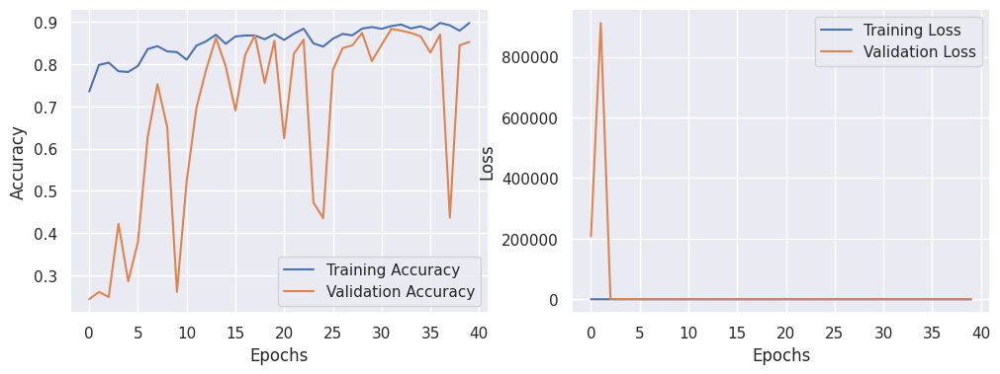

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = InceptionV3_model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

12/12 [==============================] - 6s 406ms/step
Classification Report:
                       precision    recall  f1-score   support

            cataract       0.73      0.91      0.81       110
diabetic_retinopathy       0.98      1.00      0.99       121
            glaucoma       0.81      0.76      0.79       121
              normal       1.00      0.82      0.90       121

            accuracy                           0.87       473
           macro avg       0.88      0.87      0.87       473
        weighted avg       0.88      0.87      0.87       473



In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5")
train_loss, train_accuracy = model.evaluate(train_set)
validation_loss, validation_accuracy = model.evaluate(valid_set)
test_loss, test_accuracy = model.evaluate(test_set)

print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Train Loss:':<20} {train_loss}")
print(f"{'Train Accuracy:':<20} {train_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Validation Loss:':<20} {validation_loss}")
print(f"{'Validation Accuracy:':<20} {validation_accuracy}")
print('\n' + '-'*40 + '\n' + '-'*40)
print(f"{'Test Loss:':<20} {test_loss}")
print(f"{'Test Accuracy:':<20} {test_accuracy}")

12/12 [==============================] - 1s 107ms/step - loss: 0.4487 - accuracy: 0.8858

----------------------------------------
----------------------------------------
Train Loss:          0.38640740513801575
Train Accuracy:      0.9075125455856323

----------------------------------------
----------------------------------------
Validation Loss:     0.4668968617916107
Validation Accuracy: 0.8838451504707336

----------------------------------------
----------------------------------------
Test Loss:           0.4486705958843231
Test Accuracy:       0.8858351111412048


1/1 [==============================] - 0s 24ms/step


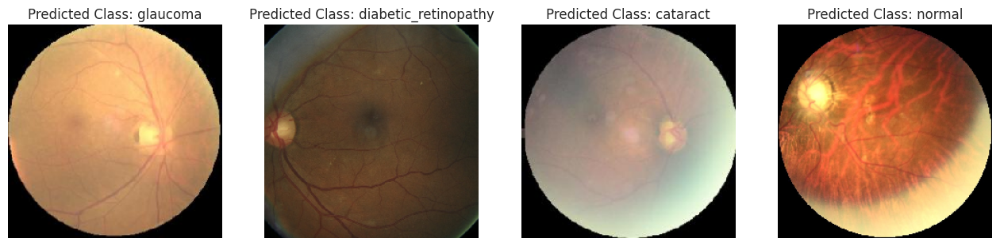

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np

def predict_and_display_images(image_paths, model_path):
    model = load_model(model_path)

    class_labels = ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

model_path = '/content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5'

image_paths = [
    '/content/eye-diseases-classification/test/cataract/_10_3215668.jpg',
    '/content/eye-diseases-classification/test/diabetic_retinopathy/1002_right.jpeg',
    '/content/eye-diseases-classification/test/glaucoma/_11_6435526.jpg',
    '/content/eye-diseases-classification/test/normal/1253_left.jpg'
]

predict_and_display_images(image_paths, model_path)


In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
img = image.load_img(img_path, target_size=(224, 224))


plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')

img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img /= 255.


threshold = 0.75
segmented_img = (img > threshold).astype(np.float32)[0]

plt.subplot(1, 2, 2)
plt.title("Segmented Image")
plt.imshow(segmented_img, cmap='gray_r')
plt.axis('off')

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
def generate_synthetic_ct_image_with_anomaly(image_path, anomaly_location=(100, 150), anomaly_size=20):
    original_image = io.imread(image_path)
    grayscale_image = color.rgb2gray(original_image)
    anomaly_mask = np.zeros_like(grayscale_image, dtype=bool)
    rr, cc = np.meshgrid(np.arange(grayscale_image.shape[0]), np.arange(grayscale_image.shape[1]), indexing='ij')
    anomaly_mask = ((rr - anomaly_location[0])**2 + (cc - anomaly_location[1])**2) < anomaly_size**2
    grayscale_image[anomaly_mask] = 1.0
    return grayscale_image, anomaly_mask
def visualize_ct_image_with_anomaly(ct_image, anomaly_mask=None):
    # Create a figure without axes
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(ct_image, cmap='gray')
    if anomaly_mask is not None:
        contours = plt.contour(anomaly_mask, levels=[0.5], colors='red', linewidths=2)
        if len(contours.levels) > 1:
            plt.colorbar(contours)
    plt.title('CT Anomaly Visualization')
    plt.show()
if __name__ == "__main__":
    image_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
    ct_image, anomaly_mask = generate_synthetic_ct_image_with_anomaly(image_path)
    visualize_ct_image_with_anomaly(ct_image, anomaly_mask)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color

def generate_oct_heatmap(image_path, disease_location=(100, 150), disease_size=20):
    oct_image = io.imread(image_path)
    oct_image_gray = color.rgb2gray(oct_image)
    rr, cc = np.meshgrid(np.arange(oct_image_gray.shape[0]), np.arange(oct_image_gray.shape[1]), indexing='ij')
    disease_mask = ((rr - disease_location[0])**2 + (cc - disease_location[1])**2) < disease_size**2
    oct_heatmap = np.zeros_like(oct_image_gray)
    oct_heatmap[disease_mask] = 1.0

    return oct_image_gray, oct_heatmap

def visualize_oct_heatmap(oct_image_gray, oct_heatmap):
    fig, ax = plt.subplots(frameon=False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    plt.imshow(oct_image_gray, cmap='gray')
    plt.imshow(oct_heatmap, cmap='hot', alpha=0.5)
    plt.title('OCT Disease Heatmap')
    plt.show()

if __name__ == "__main__":
    image_path = '/content/eye-diseases-classification/test/glaucoma/_58_8721967.jpg'
    oct_image_gray, oct_heatmap = generate_oct_heatmap(image_path)
    visualize_oct_heatmap(oct_image_gray, oct_heatmap)

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the CNN model
model = models.Sequential()

model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(4, activation='softmax'))

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
    '/content/eye-diseases-classification/train',
    target_size=(224, 224),
    batch_size=40,
    class_mode='categorical'
)

validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(
    '/content/eye-diseases-classification/test',
    target_size=(224, 224),
    batch_size=40,
    class_mode='categorical'
)


history = model.fit(
    train_generator,
    epochs=40,
    validation_data=validation_generator
)

# Save the trained model
model.save('/content/drive/MyDrive/Colab_Notebooks/CNN.h5')



94/94 [==============================] - 32s 338ms/step - loss: 0.1362 - accuracy: 0.9519 - val_loss: 0.5740 - val_accuracy: 0.8393
Epoch 20/40
94/94 [==============================] - 30s 317ms/step - loss: 0.1251 - accuracy: 0.9541 - val_loss: 0.5944 - val_accuracy: 0.8668
Epoch 21/40
94/94 [==============================] - 30s 321ms/step - loss: 0.0934 - accuracy: 0.9677 - val_loss: 0.6382 - val_accuracy: 0.8520
Epoch 22/40
94/94 [==============================] - 30s 321ms/step - loss: 0.1010 - accuracy: 0.9666 - val_loss: 0.5183 - val_accuracy: 0.8753
Epoch 23/40
94/94 [==============================] - 30s 312ms/step - loss: 0.0754 - accuracy: 0.9754 - val_loss: 0.6381 - val_accuracy: 0.8816
Epoch 24/40
94/94 [==============================] - 30s 316ms/step - loss: 0.0792 - accuracy: 0.9736 - val_loss: 0.7253 - val_accuracy: 0.8330
Epoch 25/40
94/94 [==============================] - 31s 331ms/step - loss: 0.0775 - accuracy: 0.9738 - val_loss: 0.8011 - val_accuracy: 0.8605
Epoc

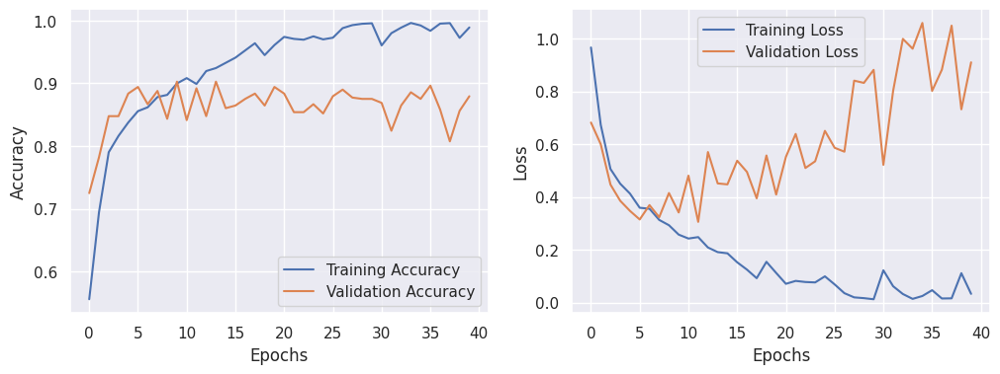

In [ ]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [ ]:
class_names = list(test_set.class_indices.keys())

predictions = model.predict(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

12/12 [==============================] - 4s 267ms/step
Classification Report:
                       precision    recall  f1-score   support

            cataract       0.73      0.85      0.79       110
diabetic_retinopathy       0.91      0.98      0.94       121
            glaucoma       0.81      0.71      0.76       121
              normal       0.91      0.82      0.86       121

            accuracy                           0.84       473
           macro avg       0.84      0.84      0.84       473
        weighted avg       0.84      0.84      0.84       473



# **ALL possible esemble result with 11 other terms for showing model comperison with confution matrix**

12/12 [==============================] - 7s 233ms/step


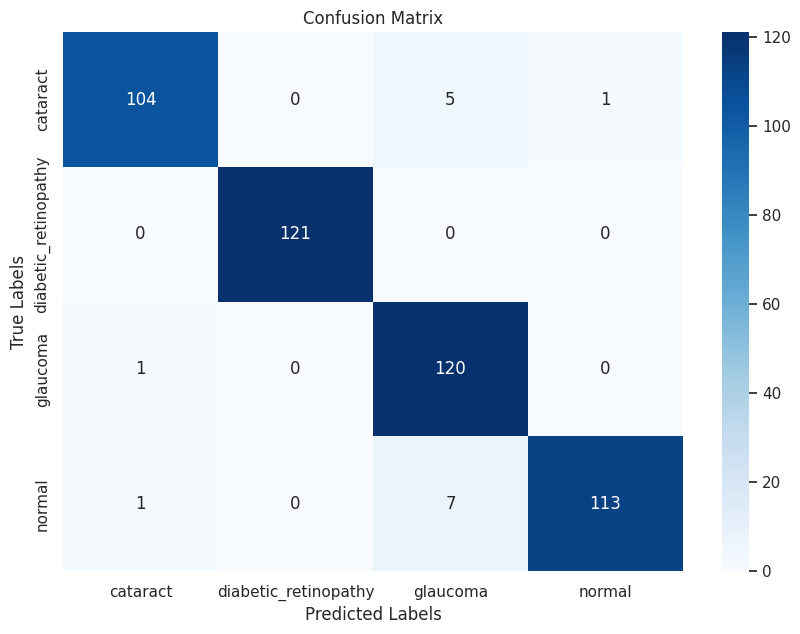

Ensemble ('DenseNet169', 'InceptionResNetV2') -> Accuracy: 0.968, Precision: 0.970, Recall: 0.968, F1-Score: 0.968, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.997, Log Loss: 0.115, MCC: 0.958, Cohen's Kappa: 0.958, Jaccard Index: 0.940, Balanced Accuracy: 0.968
12/12 [==============================] - 3s 121ms/step


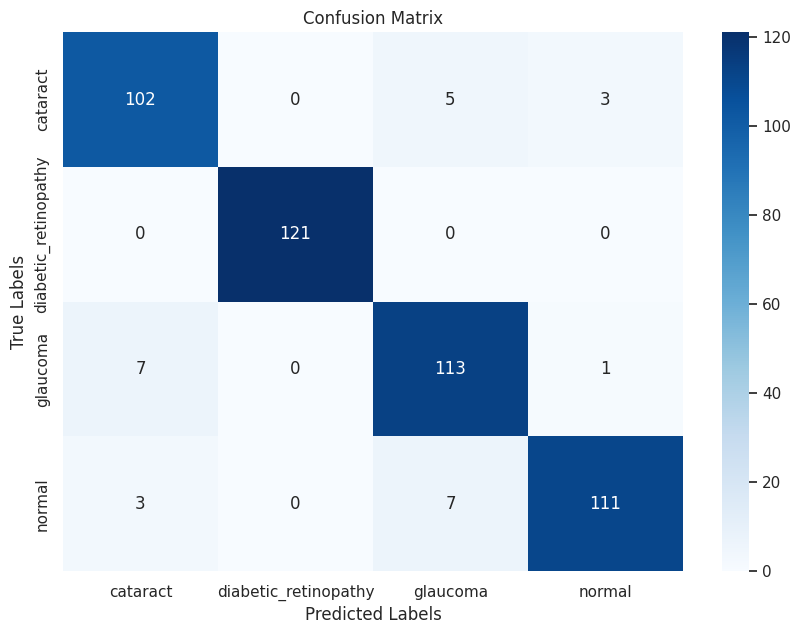

Ensemble ('DenseNet169', 'InceptionV3') -> Accuracy: 0.945, Precision: 0.946, Recall: 0.945, F1-Score: 0.945, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.994, Log Loss: 0.173, MCC: 0.927, Cohen's Kappa: 0.927, Jaccard Index: 0.898, Balanced Accuracy: 0.945
12/12 [==============================] - 2s 98ms/step


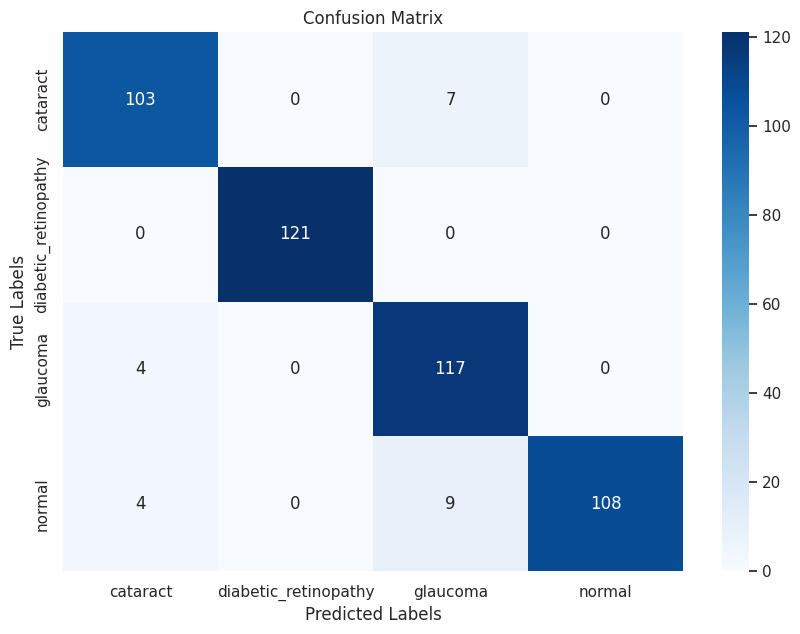

Ensemble ('DenseNet169', 'MobileNetV2') -> Accuracy: 0.949, Precision: 0.952, Recall: 0.949, F1-Score: 0.950, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.996, Log Loss: 0.145, MCC: 0.933, Cohen's Kappa: 0.932, Jaccard Index: 0.906, Balanced Accuracy: 0.949
12/12 [==============================] - 3s 161ms/step


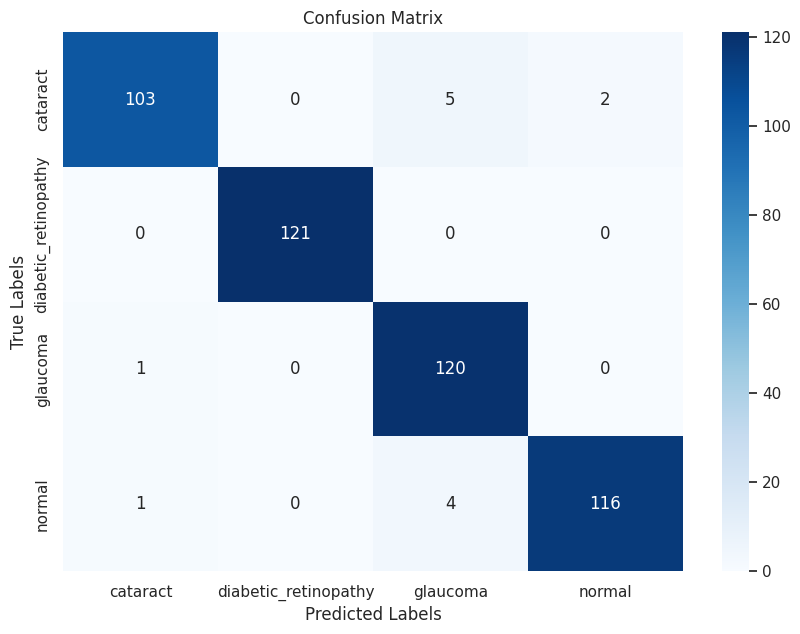

Ensemble ('DenseNet169', 'Xception') -> Accuracy: 0.973, Precision: 0.973, Recall: 0.973, F1-Score: 0.973, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.996, Log Loss: 0.117, MCC: 0.964, Cohen's Kappa: 0.963, Jaccard Index: 0.947, Balanced Accuracy: 0.972
12/12 [==============================] - 1s 113ms/step


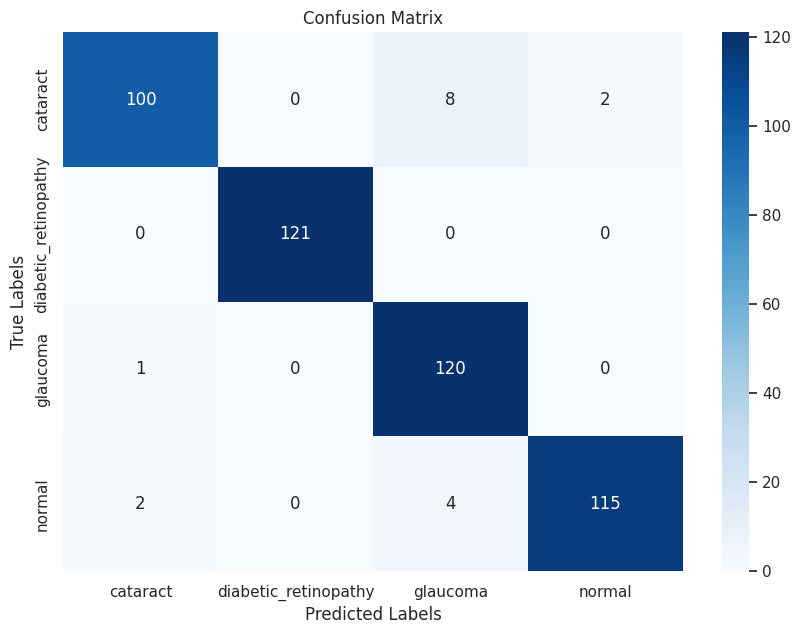

Ensemble ('InceptionResNetV2', 'InceptionV3') -> Accuracy: 0.964, Precision: 0.966, Recall: 0.964, F1-Score: 0.964, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.995, Log Loss: 0.142, MCC: 0.953, Cohen's Kappa: 0.952, Jaccard Index: 0.932, Balanced Accuracy: 0.963
12/12 [==============================] - 2s 135ms/step


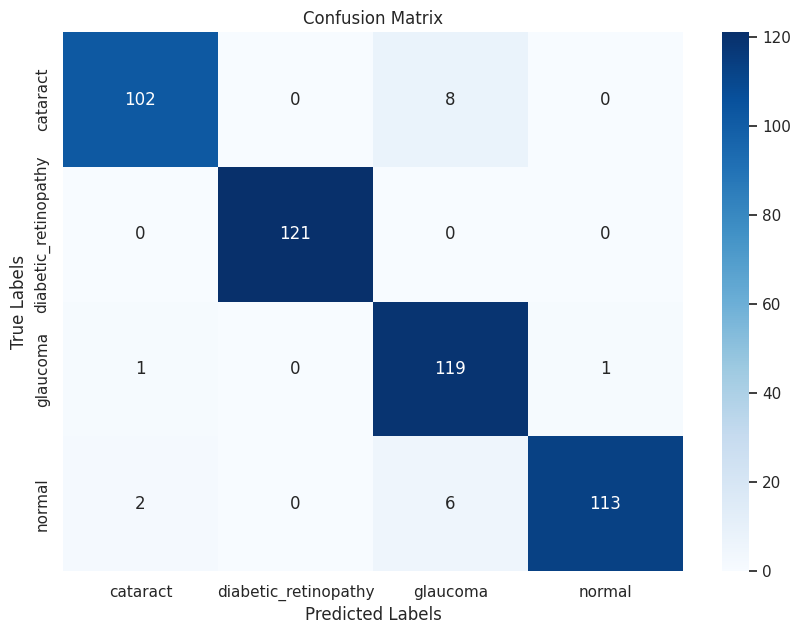

Ensemble ('InceptionResNetV2', 'MobileNetV2') -> Accuracy: 0.962, Precision: 0.964, Recall: 0.962, F1-Score: 0.962, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.997, Log Loss: 0.120, MCC: 0.950, Cohen's Kappa: 0.949, Jaccard Index: 0.928, Balanced Accuracy: 0.961
12/12 [==============================] - 2s 154ms/step


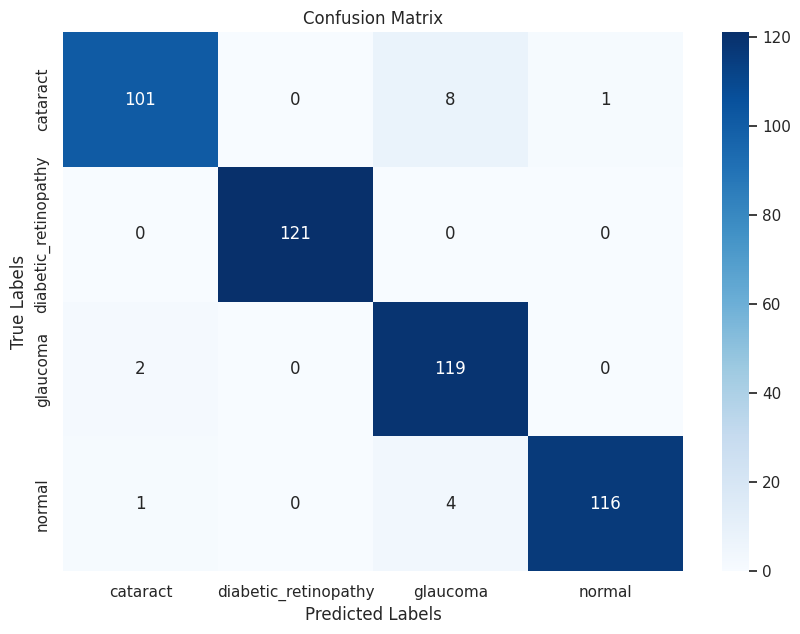

Ensemble ('InceptionResNetV2', 'Xception') -> Accuracy: 0.966, Precision: 0.968, Recall: 0.966, F1-Score: 0.966, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.998, Log Loss: 0.095, MCC: 0.955, Cohen's Kappa: 0.955, Jaccard Index: 0.936, Balanced Accuracy: 0.965
12/12 [==============================] - 1s 97ms/step


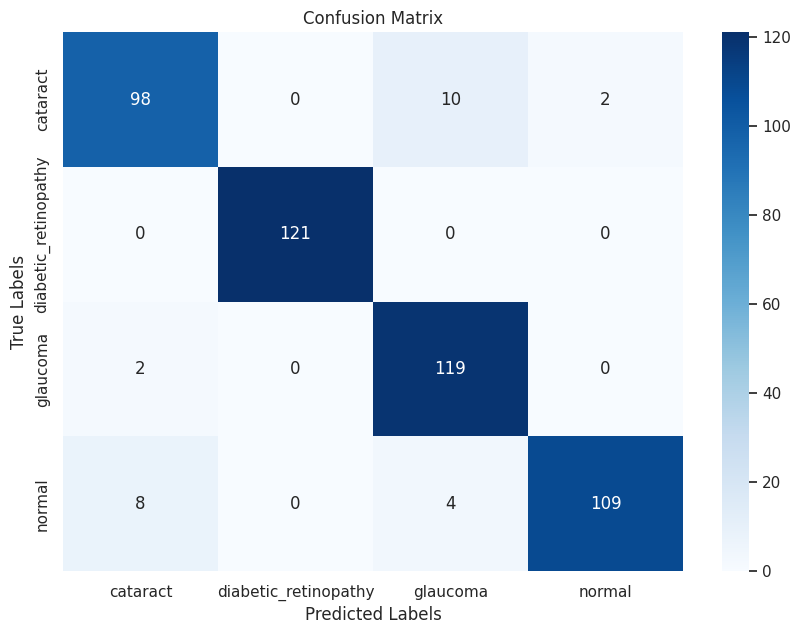

Ensemble ('InceptionV3', 'MobileNetV2') -> Accuracy: 0.945, Precision: 0.947, Recall: 0.945, F1-Score: 0.945, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.991, Log Loss: 0.198, MCC: 0.927, Cohen's Kappa: 0.927, Jaccard Index: 0.898, Balanced Accuracy: 0.944
12/12 [==============================] - 2s 176ms/step


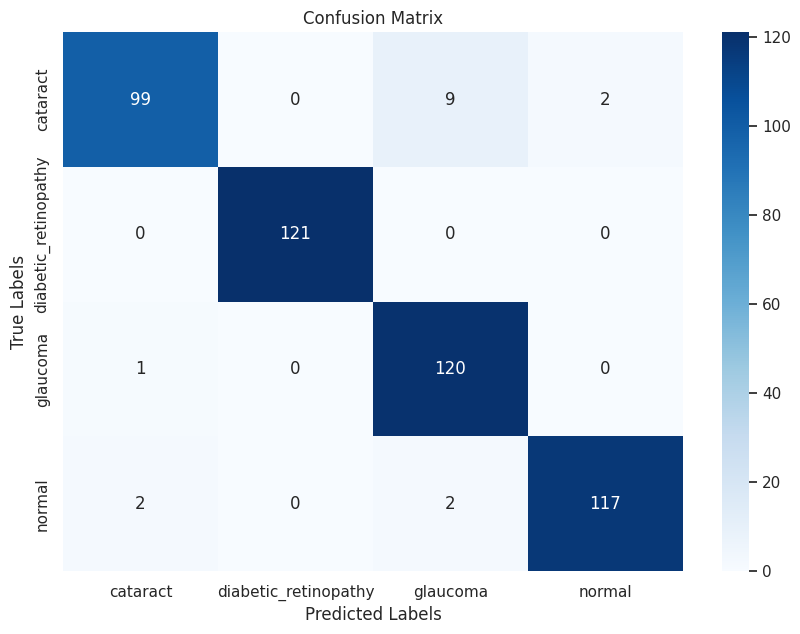

Ensemble ('InceptionV3', 'Xception') -> Accuracy: 0.966, Precision: 0.967, Recall: 0.966, F1-Score: 0.966, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.995, Log Loss: 0.157, MCC: 0.955, Cohen's Kappa: 0.955, Jaccard Index: 0.935, Balanced Accuracy: 0.965
12/12 [==============================] - 2s 153ms/step


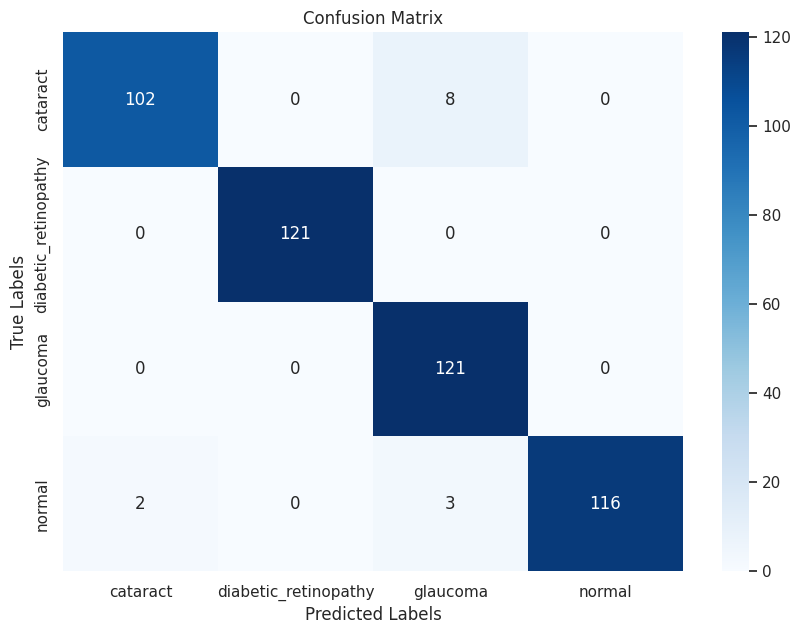

Ensemble ('MobileNetV2', 'Xception') -> Accuracy: 0.973, Precision: 0.974, Recall: 0.973, F1-Score: 0.973, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.995, Log Loss: 0.133, MCC: 0.964, Cohen's Kappa: 0.963, Jaccard Index: 0.947, Balanced Accuracy: 0.971
12/12 [==============================] - 1s 111ms/step


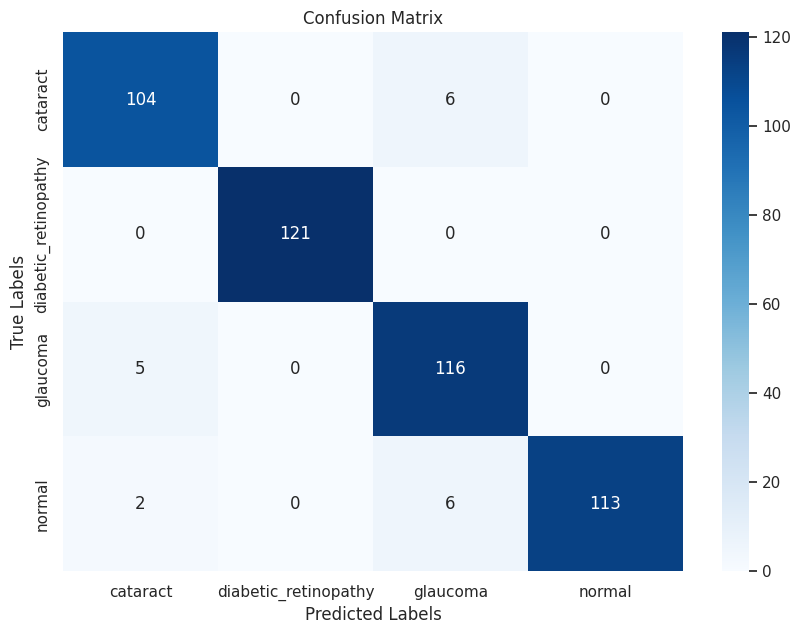

Ensemble ('DenseNet169', 'InceptionResNetV2', 'InceptionV3') -> Accuracy: 0.960, Precision: 0.961, Recall: 0.960, F1-Score: 0.960, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.998, Log Loss: 0.127, MCC: 0.947, Cohen's Kappa: 0.946, Jaccard Index: 0.925, Balanced Accuracy: 0.960
12/12 [==============================] - 1s 107ms/step


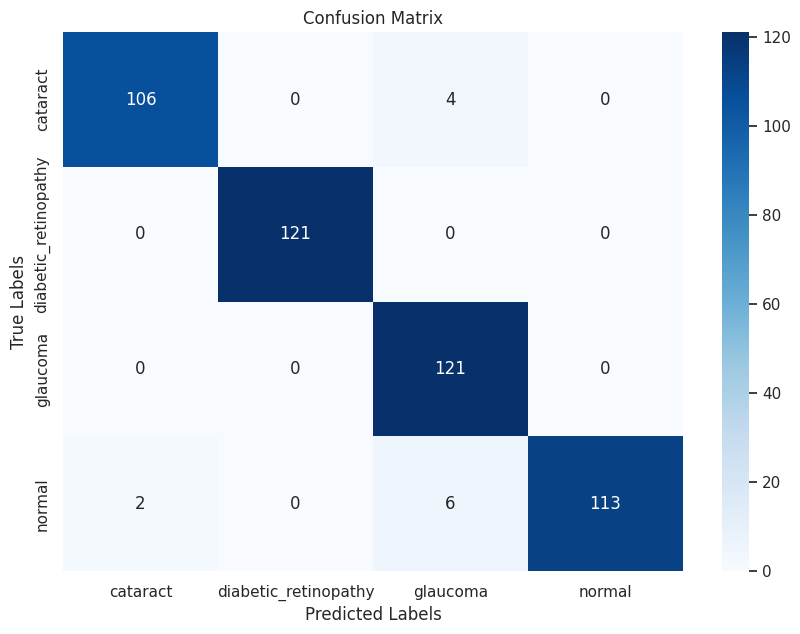

Ensemble ('DenseNet169', 'InceptionResNetV2', 'MobileNetV2') -> Accuracy: 0.975, Precision: 0.976, Recall: 0.975, F1-Score: 0.975, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.997, Log Loss: 0.116, MCC: 0.967, Cohen's Kappa: 0.966, Jaccard Index: 0.951, Balanced Accuracy: 0.974
12/12 [==============================] - 2s 153ms/step


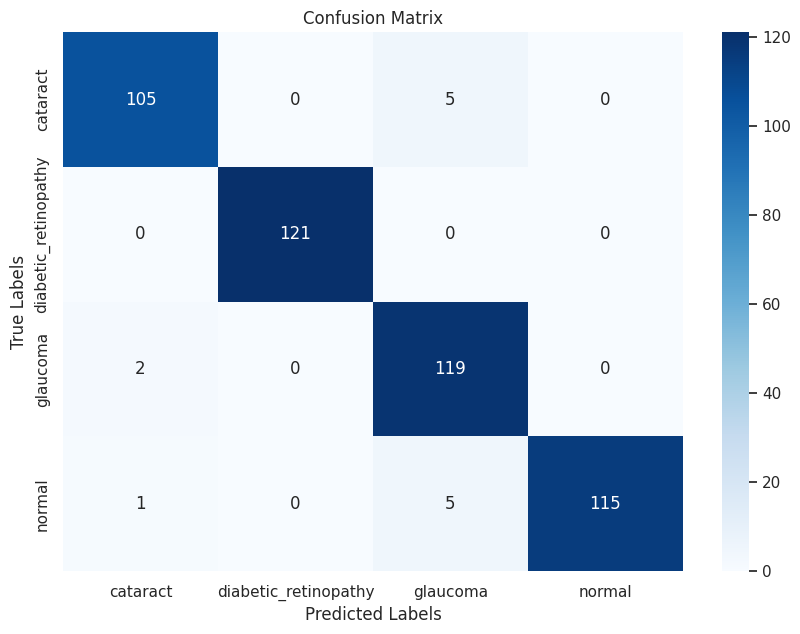

Ensemble ('DenseNet169', 'InceptionResNetV2', 'Xception') -> Accuracy: 0.973, Precision: 0.974, Recall: 0.973, F1-Score: 0.973, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.998, Log Loss: 0.099, MCC: 0.964, Cohen's Kappa: 0.963, Jaccard Index: 0.947, Balanced Accuracy: 0.972
12/12 [==============================] - 2s 140ms/step


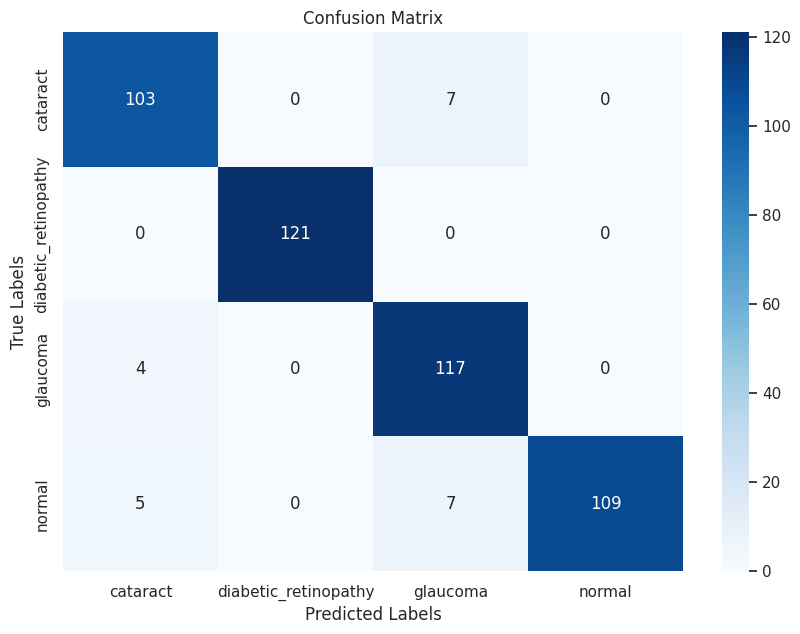

Ensemble ('DenseNet169', 'InceptionV3', 'MobileNetV2') -> Accuracy: 0.951, Precision: 0.954, Recall: 0.951, F1-Score: 0.952, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.996, Log Loss: 0.152, MCC: 0.936, Cohen's Kappa: 0.935, Jaccard Index: 0.909, Balanced Accuracy: 0.951
12/12 [==============================] - 2s 151ms/step


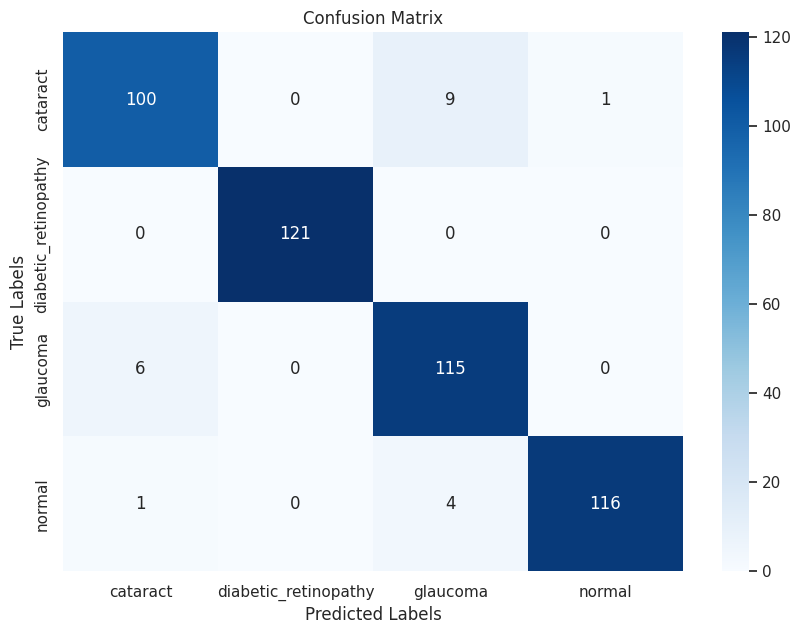

Ensemble ('DenseNet169', 'InceptionV3', 'Xception') -> Accuracy: 0.956, Precision: 0.957, Recall: 0.956, F1-Score: 0.956, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.997, Log Loss: 0.131, MCC: 0.941, Cohen's Kappa: 0.941, Jaccard Index: 0.917, Balanced Accuracy: 0.955
12/12 [==============================] - 2s 196ms/step


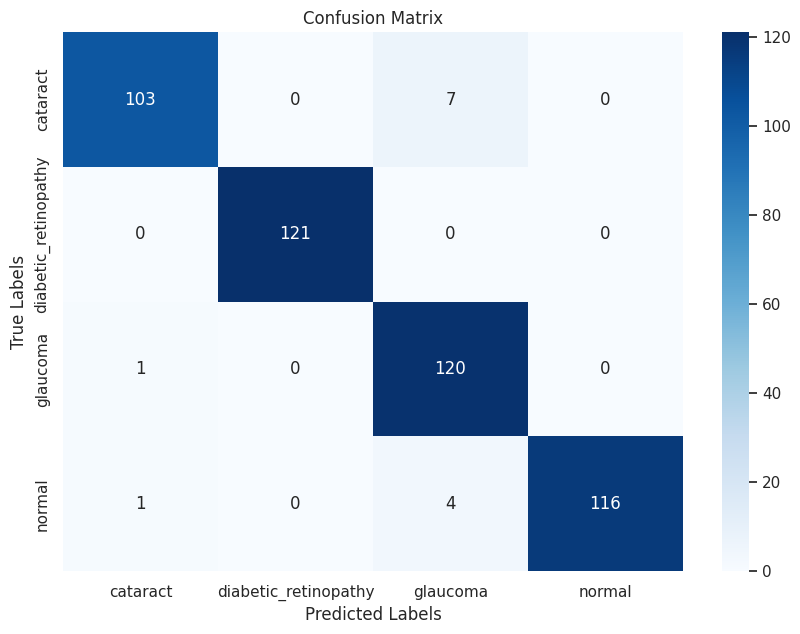

Ensemble ('DenseNet169', 'MobileNetV2', 'Xception') -> Accuracy: 0.973, Precision: 0.974, Recall: 0.973, F1-Score: 0.973, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.997, Log Loss: 0.118, MCC: 0.964, Cohen's Kappa: 0.963, Jaccard Index: 0.947, Balanced Accuracy: 0.972
12/12 [==============================] - 1s 106ms/step


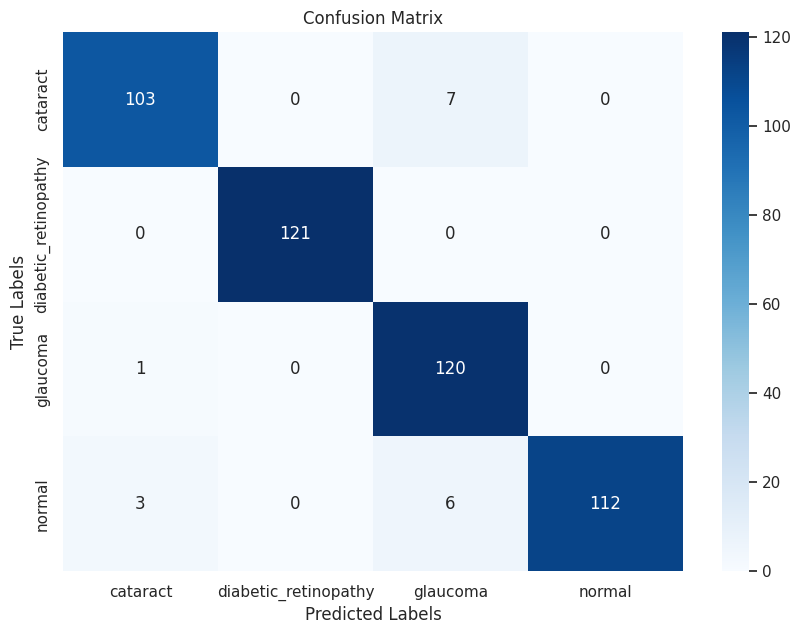

Ensemble ('InceptionResNetV2', 'InceptionV3', 'MobileNetV2') -> Accuracy: 0.964, Precision: 0.966, Recall: 0.964, F1-Score: 0.964, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.996, Log Loss: 0.135, MCC: 0.953, Cohen's Kappa: 0.952, Jaccard Index: 0.932, Balanced Accuracy: 0.963
12/12 [==============================] - 2s 153ms/step


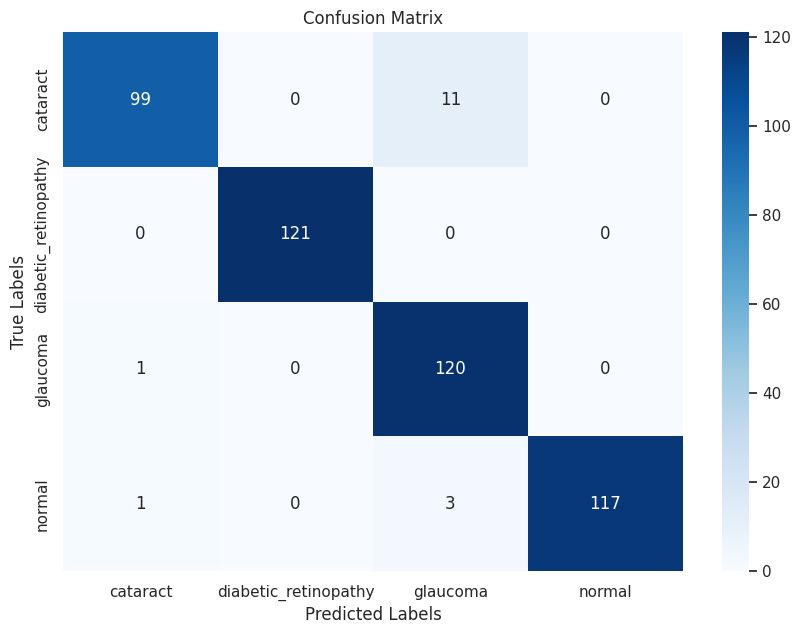

Ensemble ('InceptionResNetV2', 'InceptionV3', 'Xception') -> Accuracy: 0.966, Precision: 0.969, Recall: 0.966, F1-Score: 0.966, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.998, Log Loss: 0.116, MCC: 0.956, Cohen's Kappa: 0.955, Jaccard Index: 0.936, Balanced Accuracy: 0.965
12/12 [==============================] - 2s 155ms/step


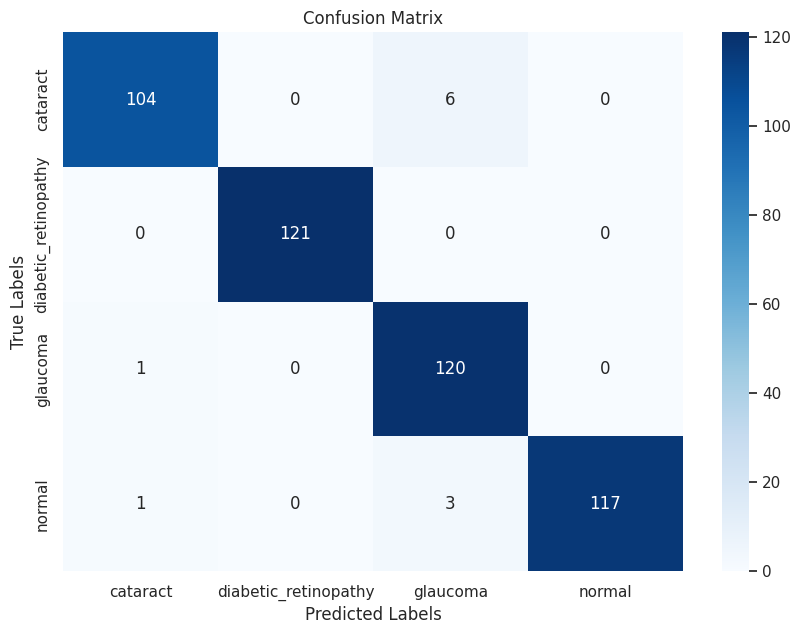

Ensemble ('InceptionResNetV2', 'MobileNetV2', 'Xception') -> Accuracy: 0.977, Precision: 0.978, Recall: 0.977, F1-Score: 0.977, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.997, Log Loss: 0.104, MCC: 0.969, Cohen's Kappa: 0.969, Jaccard Index: 0.955, Balanced Accuracy: 0.976
12/12 [==============================] - 3s 220ms/step


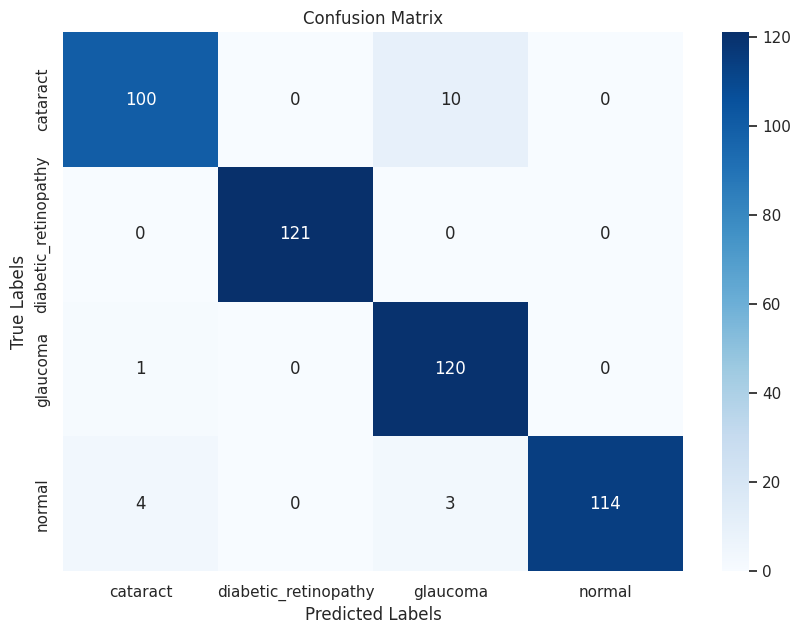

Ensemble ('InceptionV3', 'MobileNetV2', 'Xception') -> Accuracy: 0.962, Precision: 0.964, Recall: 0.962, F1-Score: 0.962, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.995, Log Loss: 0.147, MCC: 0.950, Cohen's Kappa: 0.949, Jaccard Index: 0.928, Balanced Accuracy: 0.961
12/12 [==============================] - 1s 98ms/step


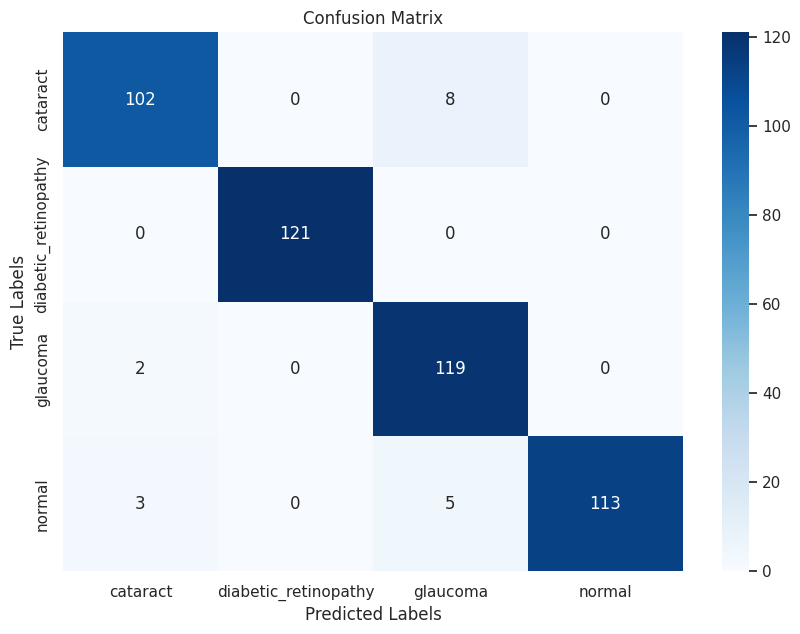

Ensemble ('DenseNet169', 'InceptionResNetV2', 'InceptionV3', 'MobileNetV2') -> Accuracy: 0.962, Precision: 0.964, Recall: 0.962, F1-Score: 0.962, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.998, Log Loss: 0.126, MCC: 0.950, Cohen's Kappa: 0.949, Jaccard Index: 0.928, Balanced Accuracy: 0.961
12/12 [==============================] - 2s 154ms/step


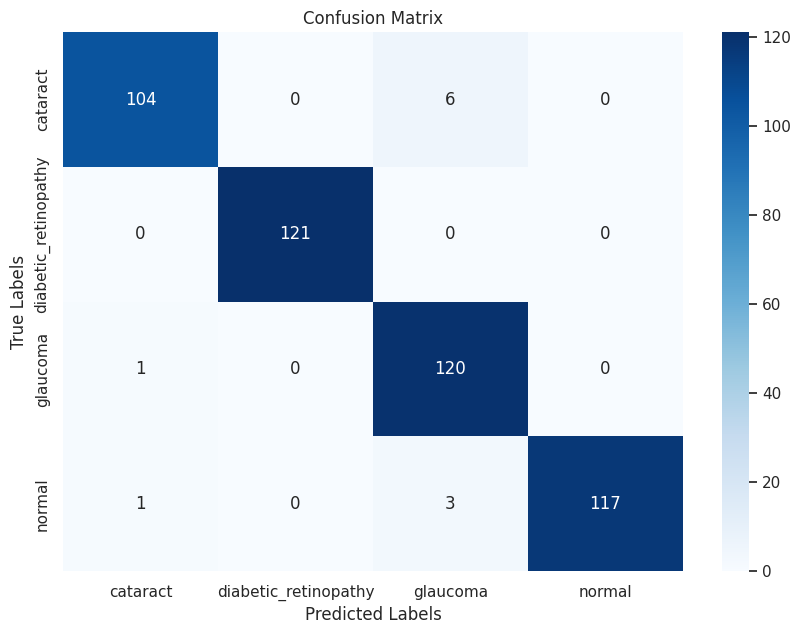

Ensemble ('DenseNet169', 'InceptionResNetV2', 'InceptionV3', 'Xception') -> Accuracy: 0.977, Precision: 0.978, Recall: 0.977, F1-Score: 0.977, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.998, Log Loss: 0.112, MCC: 0.969, Cohen's Kappa: 0.969, Jaccard Index: 0.955, Balanced Accuracy: 0.976
12/12 [==============================] - 2s 156ms/step


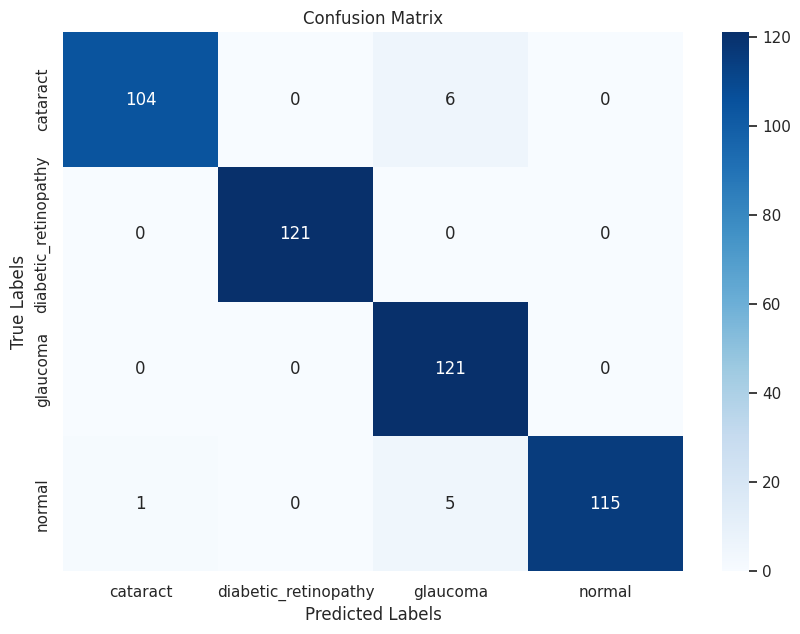

Ensemble ('DenseNet169', 'InceptionResNetV2', 'MobileNetV2', 'Xception') -> Accuracy: 0.975, Precision: 0.976, Recall: 0.975, F1-Score: 0.975, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.997, Log Loss: 0.105, MCC: 0.967, Cohen's Kappa: 0.966, Jaccard Index: 0.951, Balanced Accuracy: 0.974
12/12 [==============================] - 2s 155ms/step


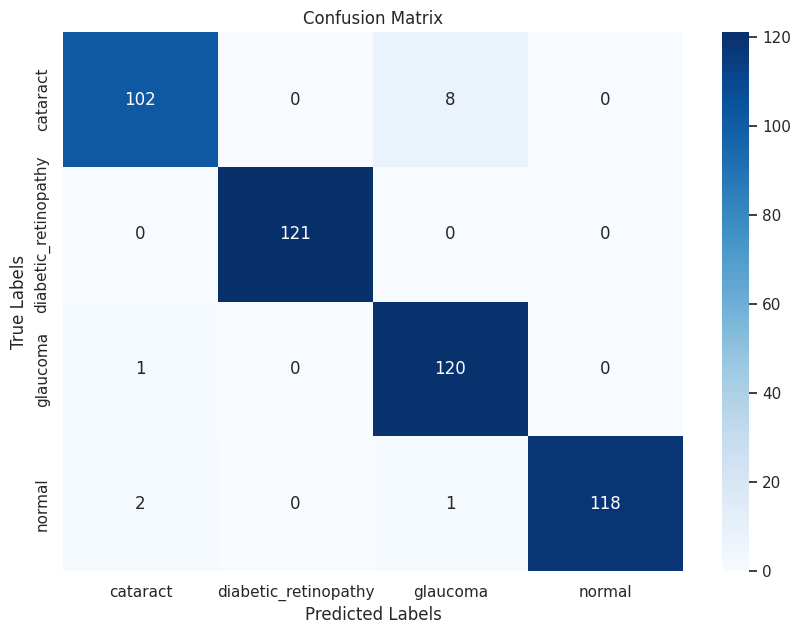

Ensemble ('DenseNet169', 'InceptionV3', 'MobileNetV2', 'Xception') -> Accuracy: 0.975, Precision: 0.976, Recall: 0.975, F1-Score: 0.975, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.998, Log Loss: 0.129, MCC: 0.966, Cohen's Kappa: 0.966, Jaccard Index: 0.951, Balanced Accuracy: 0.974
12/12 [==============================] - 2s 153ms/step


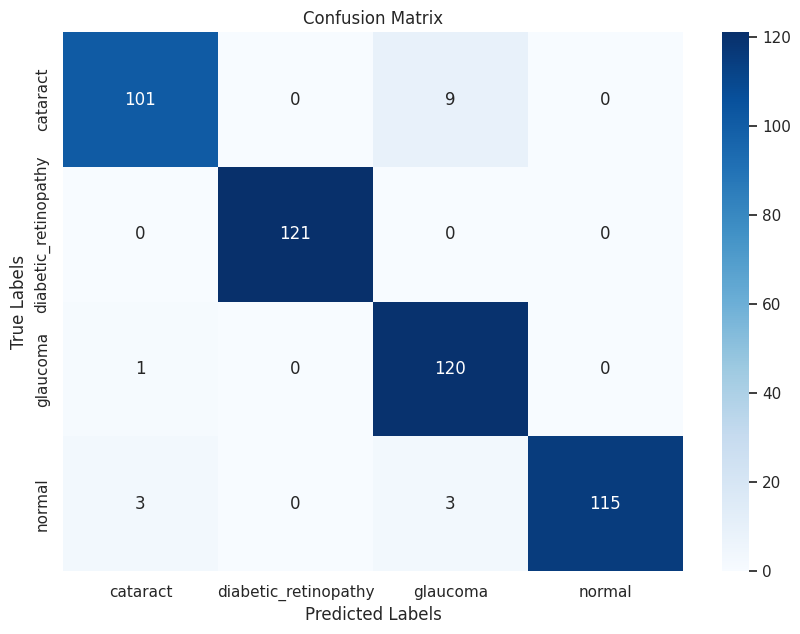

Ensemble ('InceptionResNetV2', 'InceptionV3', 'MobileNetV2', 'Xception') -> Accuracy: 0.966, Precision: 0.968, Recall: 0.966, F1-Score: 0.966, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.998, Log Loss: 0.118, MCC: 0.955, Cohen's Kappa: 0.955, Jaccard Index: 0.936, Balanced Accuracy: 0.965
12/12 [==============================] - 2s 154ms/step


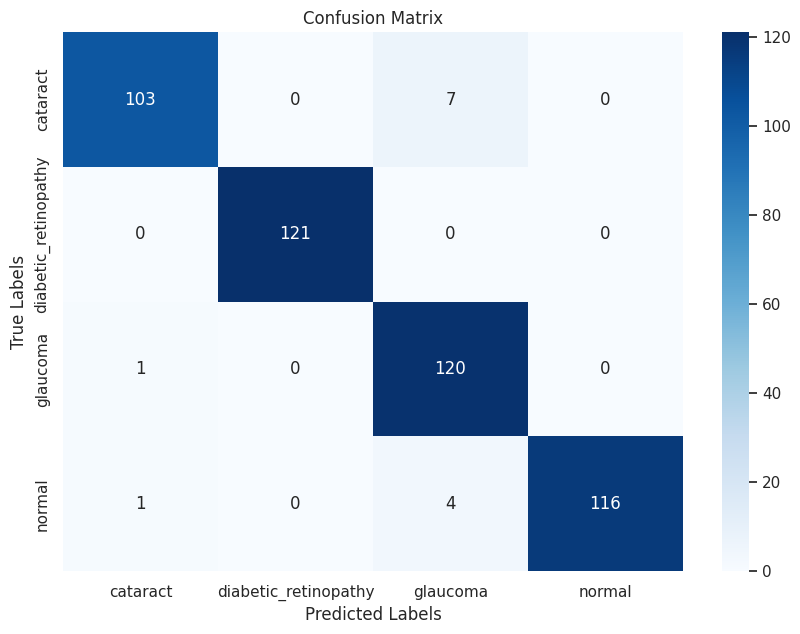

Ensemble ('DenseNet169', 'InceptionResNetV2', 'InceptionV3', 'MobileNetV2', 'Xception') -> Accuracy: 0.973, Precision: 0.974, Recall: 0.973, F1-Score: 0.973, Sensitivity: 1.000, Specificity: 1.000, ROC-AUC: 0.998, Log Loss: 0.115, MCC: 0.964, Cohen's Kappa: 0.963, Jaccard Index: 0.947, Balanced Accuracy: 0.972


In [19]:
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
from sklearn.metrics import log_loss, accuracy_score, matthews_corrcoef, cohen_kappa_score, jaccard_score, balanced_accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

DenseNet169 = '/content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5'
InceptionResNetV2 = '/content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5'
InceptionV3 = '/content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5'
MobileNetV2 = '/content/drive/MyDrive/Colab_Notebooks/MobileNetV2.h5'
Xception = '/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5'
model_paths = [
    DenseNet169, InceptionResNetV2, InceptionV3, MobileNetV2, Xception
]
model_names = [
    'DenseNet169', 'InceptionResNetV2', 'InceptionV3', 'MobileNetV2', 'Xception'
]
models = {name: load_model(path) for name, path in zip(model_names, model_paths)}

def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

def evaluate_ensemble(selected_models, test_set):
    predictions = [models[name].predict(test_set) for name in selected_models]
    average_predictions = np.mean(predictions, axis=0)
    final_predictions = np.argmax(average_predictions, axis=1)
    true_labels = test_set.classes

    accuracy = accuracy_score(true_labels, final_predictions)
    precision = precision_score(true_labels, final_predictions, average='weighted')
    recall = recall_score(true_labels, final_predictions, average='weighted')
    f1 = f1_score(true_labels, final_predictions, average='weighted')
    logloss = log_loss(true_labels, average_predictions)
    mcc = matthews_corrcoef(true_labels, final_predictions)
    kappa = cohen_kappa_score(true_labels, final_predictions)
    jaccard = jaccard_score(true_labels, final_predictions, average='weighted')
    balanced_acc = balanced_accuracy_score(true_labels, final_predictions)

    cm = confusion_matrix(true_labels, final_predictions)
    TN = cm[0][0]
    FP = cm[0][1]
    FN = cm[1][0]
    TP = cm[1][1]
    sensitivity = TP / (TP + FN)
    specificity = TN / (TN + FP)

    roc_auc = roc_auc_score(true_labels, average_predictions, multi_class='ovr', average='weighted')

    plot_confusion_matrix(cm, class_names=test_set.class_indices.keys())

    return accuracy, precision, recall, f1, sensitivity, specificity, roc_auc, logloss, mcc, kappa, jaccard, balanced_acc

def generate_combinations(arr):
    n = len(arr)
    for r in range(2, n + 1):
        for combo in combinations(arr, r):
            yield combo

for combo in generate_combinations(model_names):
    results = evaluate_ensemble(combo, test_set)
    print(f"Ensemble {combo} -> "
          f"Accuracy: {results[0]:.3f}, Precision: {results[1]:.3f}, Recall: {results[2]:.3f}, F1-Score: {results[3]:.3f}, "
          f"Sensitivity: {results[4]:.3f}, Specificity: {results[5]:.3f}, ROC-AUC: {results[6]:.3f}, "
          f"Log Loss: {results[7]:.3f}, MCC: {results[8]:.3f}, "
          f"Cohen's Kappa: {results[9]:.3f}, Jaccard Index: {results[10]:.3f}, Balanced Accuracy: {results[11]:.3f}")


# **Tabular representation of 12 math terms**

In [21]:
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
from sklearn.metrics import log_loss, accuracy_score, matthews_corrcoef, cohen_kappa_score, jaccard_score, balanced_accuracy_score
import pandas as pd
from itertools import combinations

DenseNet169 = '/content/drive/MyDrive/Colab_Notebooks/DenseNet169.h5'
InceptionResNetV2 = '/content/drive/MyDrive/Colab_Notebooks/InceptionResNetV2.h5'
InceptionV3 = '/content/drive/MyDrive/Colab_Notebooks/InceptionV3.h5'
MobileNetV2 = '/content/drive/MyDrive/Colab_Notebooks/MobileNetV2.h5'
Xception = '/content/drive/MyDrive/Colab_Notebooks/Xception_model.h5'
model_paths = [
    DenseNet169, InceptionResNetV2, InceptionV3, MobileNetV2, Xception
]
model_names = [
    'DenseNet169', 'InceptionResNetV2', 'InceptionV3', 'MobileNetV2', 'Xception'
]
models = {name: load_model(path) for name, path in zip(model_names, model_paths)}

def evaluate_ensemble(selected_models, test_set):
    predictions = [models[name].predict(test_set) for name in selected_models]
    average_predictions = np.mean(predictions, axis=0)
    final_predictions = np.argmax(average_predictions, axis=1)
    true_labels = test_set.classes

    accuracy = accuracy_score(true_labels, final_predictions)
    precision = precision_score(true_labels, final_predictions, average='weighted')
    recall = recall_score(true_labels, final_predictions, average='weighted')
    f1 = f1_score(true_labels, final_predictions, average='weighted')
    logloss = log_loss(true_labels, average_predictions)
    mcc = matthews_corrcoef(true_labels, final_predictions)
    kappa = cohen_kappa_score(true_labels, final_predictions)
    jaccard = jaccard_score(true_labels, final_predictions, average='weighted')
    balanced_acc = balanced_accuracy_score(true_labels, final_predictions)

    cm = confusion_matrix(true_labels, final_predictions)
    TN = cm[0][0]
    FP = cm[0][1]
    FN = cm[1][0]
    TP = cm[1][1]
    sensitivity = TP / (TP + FN)
    specificity = TN / (TN + FP)

    roc_auc = roc_auc_score(true_labels, average_predictions, multi_class='ovr', average='weighted')

    return {
        'Ensemble': selected_models,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'ROC-AUC': roc_auc,
        'Log Loss': logloss,
        'MCC': mcc,
        'Cohen\'s Kappa': kappa,
        'Jaccard Index': jaccard,
        'Balanced Accuracy': balanced_acc
    }

def generate_combinations(arr):
    n = len(arr)
    for r in range(2, n + 1):
        for combo in combinations(arr, r):
            yield combo

results_list = []
for combo in generate_combinations(model_names):
    results = evaluate_ensemble(combo, test_set)
    results_list.append(results)

results_df = pd.DataFrame(results_list)
results_df['Ensemble'] = results_df['Ensemble'].apply(lambda x: ', '.join(x))
print(results_df.to_string(index=False))


12/12 [==============================] - 2s 153ms/step
                                                          Ensemble  Accuracy  Precision   Recall  F1-Score  Sensitivity  Specificity  ROC-AUC  Log Loss      MCC  Cohen's Kappa  Jaccard Index  Balanced Accuracy
                                    DenseNet169, InceptionResNetV2  0.968288   0.970112 0.968288  0.968445          1.0          1.0 0.996911  0.115172 0.958215       0.957683       0.939513           0.967769
                                          DenseNet169, InceptionV3  0.945032   0.945780 0.945032  0.945171          1.0          1.0 0.994367  0.173311 0.926834       0.926679       0.897997           0.944628
                                          DenseNet169, MobileNetV2  0.949260   0.952464 0.949260  0.949550          1.0          1.0 0.995848  0.144734 0.933188       0.932315       0.905608           0.948967
                                             DenseNet169, Xception  0.972516   0.973387 0.972516  0.97254